<a href="https://colab.research.google.com/github/Fabio-Morganti/Progetto-Python-Data-Science/blob/main/Progetto_NetworkX.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import random
import seaborn as sns
import pandas as pd
import plotly.graph_objects as go
import datetime
import numpy as np

# Generale

In [ ]:
def draw(G, pos, measures, measure_name):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1))
    
    # labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Progetto NetworkX/soc-sign-bitcoinotc.csv', header=None)
data.columns = ['Source', 'Target', 'Rating', 'Time']
data.head()

,Source,Target,Rating,Time
0,6,2,4,1.289242e+09
1,6,5,2,1.289242e+09
2,1,15,1,1.289243e+09
3,4,3,7,1.289245e+09
4,13,16,8,1.289254e+09


In [ ]:
data['Time'] = data['Time'].apply(lambda x: datetime.datetime.fromtimestamp(x))
data['Time'].head()

0   2010-11-08 18:45:11.728360
1   2010-11-08 18:45:41.533780
2   2010-11-08 19:05:40.390490
3   2010-11-08 19:41:17.369750
4   2010-11-08 22:10:54.447460
Name: Time, dtype: datetime64[ns]

In [ ]:
graph = nx.DiGraph()

In [ ]:
data['Source']= data['Source'].apply(lambda x: str(x))
data['Target']= data['Target'].apply(lambda x: str(x))

In [ ]:
 nodes = list(set(data['Source'].values).union(set(data['Target'].values)))
 print(nodes)

['1170', '2631', '4611', '4657', '331', '609', '2252', '3737', '972', '347', '2824', '4802', '5104', '538', '2746', '3806', '4553', '2078', '994', '2688', '1704', '3808', '3596', '3862', '3729', '148', '5229', '2601', '2637', '1300', '4407', '3979', '838', '2202', '3368', '3168', '902', '1558', '3379', '2214', '643', '675', '585', '779', '1218', '1933', '1835', '5263', '4542', '694', '505', '247', '4706', '51', '421', '465', '1851', '1946', '2982', '2498', '1254', '1506', '5781', '3024', '1151', '2960', '4063', '4183', '5779', '4036', '4633', '5508', '5935', '5560', '2496', '5390', '74', '5754', '5309', '4461', '5079', '504', '4596', '754', '1221', '2093', '1129', '2625', '3296', '940', '4721', '4477', '2876', '5540', '3850', '2719', '1323', '2980', '4863', '4129', '4615', '4052', '4084', '1081', '3501', '2164', '3146', '4788', '652', '2912', '1906', '2031', '5430', '3924', '2363', '5971', '3241', '376', '889', '230', '2755', '3751', '1449', '1122', '2598', '5772', '1480', '5070', '235

In [ ]:
graph.add_nodes_from(nodes)

In [ ]:
data['edges'] = data[['Source', 'Target', 'Rating']].apply(tuple, axis=1)
data.edges.head()

0      (6, 2, 4)
1      (6, 5, 2)
2     (1, 15, 1)
3      (4, 3, 7)
4    (13, 16, 8)
Name: edges, dtype: object

In [ ]:
graph.add_weighted_edges_from(data['edges'].values)

In [ ]:
data.head()

,Source,Target,Rating,Time,edges
0,6,2,4,2010-11-08 18:45:11.728360,"(6, 2, 4)"
1,6,5,2,2010-11-08 18:45:41.533780,"(6, 5, 2)"
2,1,15,1,2010-11-08 19:05:40.390490,"(1, 15, 1)"
3,4,3,7,2010-11-08 19:41:17.369750,"(4, 3, 7)"
4,13,16,8,2010-11-08 22:10:54.447460,"(13, 16, 8)"


In [ ]:
data['Date'] = [d.date() for d in data['Time']]
data['Time'] = [d.time() for d in data['Time']]

In [ ]:
data

,Source,Target,Rating,Time,edges,Date
0,6,2,4,18:45:11.728360,"(6, 2, 4)",2010-11-08
1,6,5,2,18:45:41.533780,"(6, 5, 2)",2010-11-08
2,1,15,1,19:05:40.390490,"(1, 15, 1)",2010-11-08
3,4,3,7,19:41:17.369750,"(4, 3, 7)",2010-11-08
4,13,16,8,22:10:54.447460,"(13, 16, 8)",2010-11-08
...,...,...,...,...,...,...
35587,4499,1810,1,05:14:41.647290,"(4499, 1810, 1)",2016-01-24
35588,2731,3901,5,23:50:28.049490,"(2731, 3901, 5)",2016-01-24
35589,2731,4897,5,23:50:34.034020,"(2731, 4897, 5)",2016-01-24
35590,13,1128,1,23:53:52.985710,"(13, 1128, 1)",2016-01-24


In [ ]:
data['Date'] = pd.to_datetime(data['Date'])
#data['Time'] = pd.to_datetime(data['Time'])
print(data.dtypes)

Source            object
Target            object
Rating             int64
Time              object
edges             object
Date      datetime64[ns]
dtype: object


In [ ]:
data['Year'] = data['Date'].dt.year
data['Month'] = data['Date'].dt.month
data['Day'] = data['Date'].dt.day

In [ ]:
data.describe()

,Rating,Year,Month,Day
count,35592.000000,35592.000000,35592.000000,35592.000000
mean,1.012025,2012.466144,6.460974,15.460216
std,3.562094,1.063376,3.129319,8.716421
min,-10.000000,2010.000000,1.000000,1.000000
25%,1.000000,2012.000000,4.000000,8.000000
50%,1.000000,2013.000000,6.000000,15.000000
75%,2.000000,2013.000000,9.000000,23.000000
max,10.000000,2016.000000,12.000000,31.000000


In [ ]:
data.head()

,Source,Target,Rating,Time,edges,Date,Year,Month,Day
0,6,2,4,18:45:11.728360,"(6, 2, 4)",2010-11-08,2010,11,8
1,6,5,2,18:45:41.533780,"(6, 5, 2)",2010-11-08,2010,11,8
2,1,15,1,19:05:40.390490,"(1, 15, 1)",2010-11-08,2010,11,8
3,4,3,7,19:41:17.369750,"(4, 3, 7)",2010-11-08,2010,11,8
4,13,16,8,22:10:54.447460,"(13, 16, 8)",2010-11-08,2010,11,8


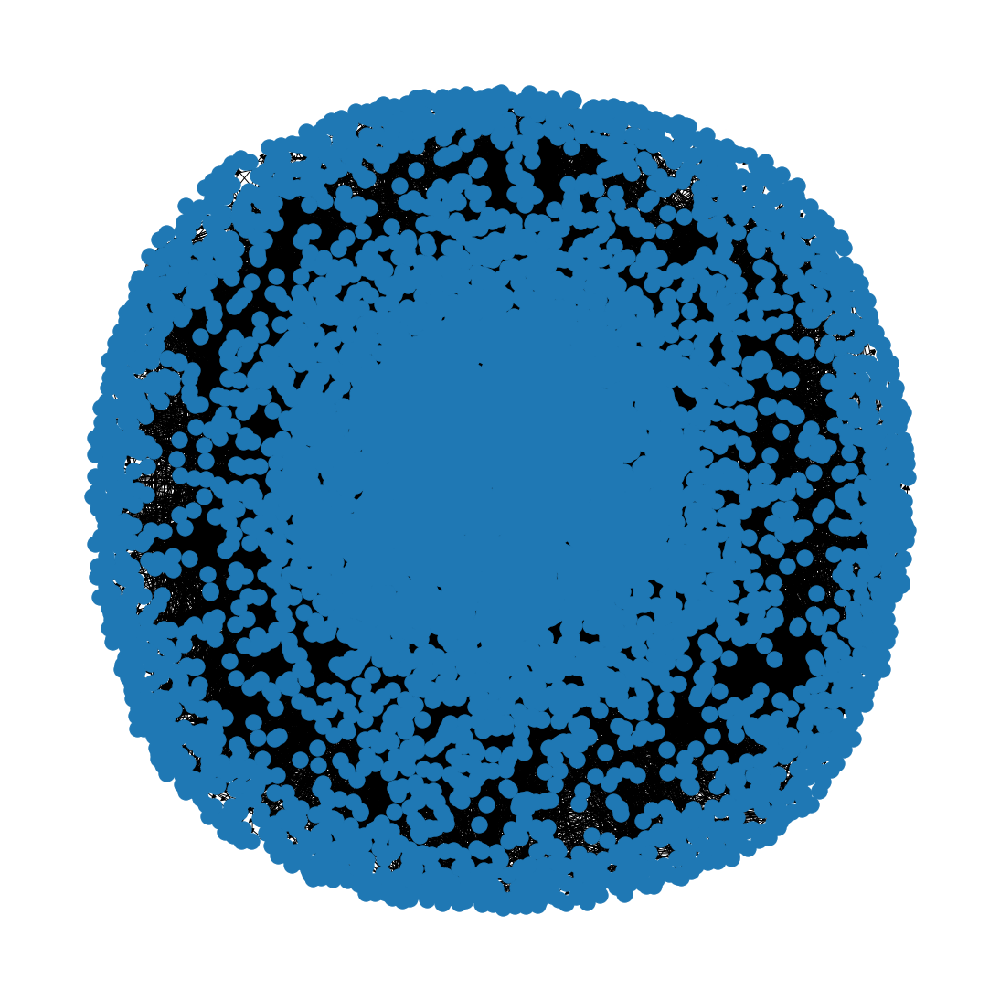

In [ ]:
plt.figure(figsize=(15,15))
pos = nx.spring_layout(graph, k = 7/np.sqrt(graph.order()))
nx.draw(graph, pos, with_labels=False)
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/total_graph.png')

2011

# 2011

In [ ]:
data2011 = pd.DataFrame()
data2011 = data[data['Year']==2011]

In [ ]:
graph2011 = nx.DiGraph()
nodes = list(set(data2011['Source'].values).union(set(data2011['Target'].values)))
graph2011.add_nodes_from(nodes)
graph2011.add_weighted_edges_from(data2011['edges'].values)

In [ ]:
print("NODES: ", len(graph2011.nodes))
print("EDGES: ", len(graph2011.edges))
print("CLUSTERING: ", nx.average_clustering(graph2011))

NODES:  1625
EDGES:  7758
CLUSTERING:  0.09566122667171506


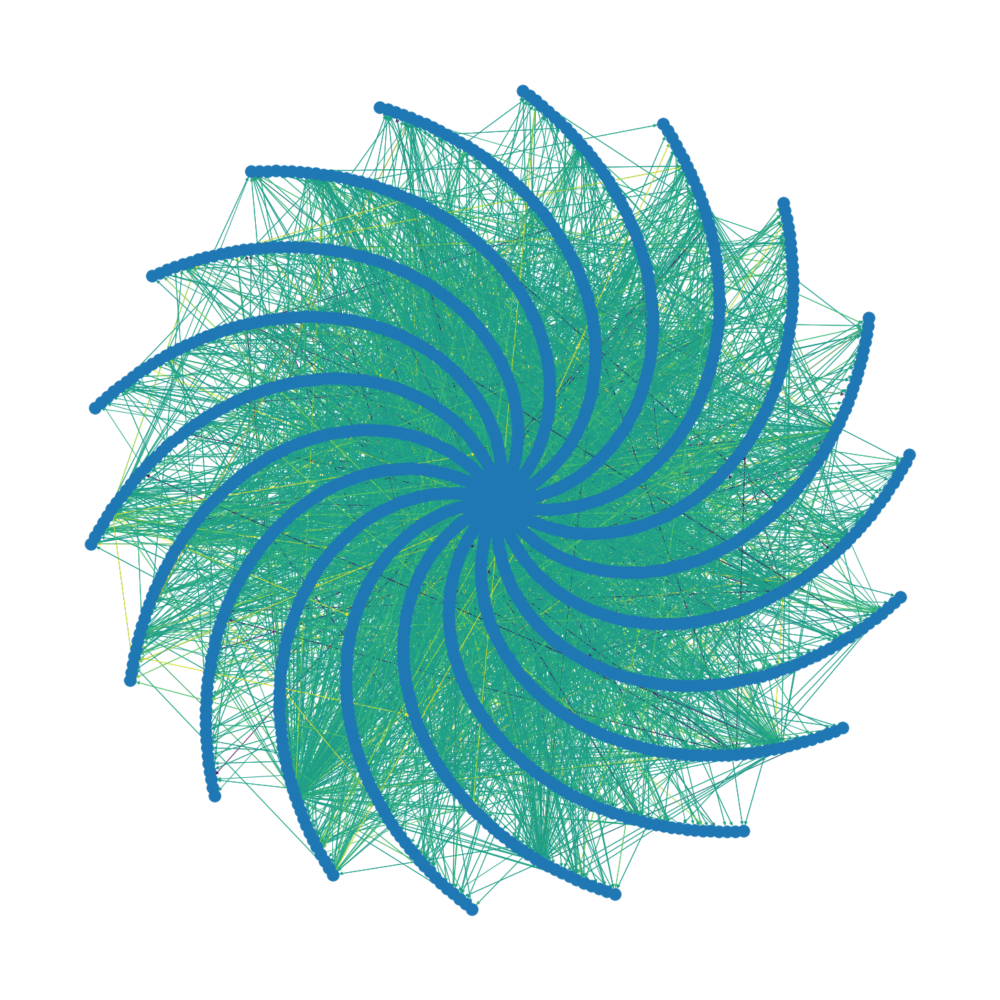

In [ ]:
weights = data2011['Rating'].values
pos = nx.spiral_layout(graph2011)
plt.figure(figsize=(20,20))
nx.draw(graph2011, pos, edge_color=weights, with_labels=False)
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/2011_spiral.png')

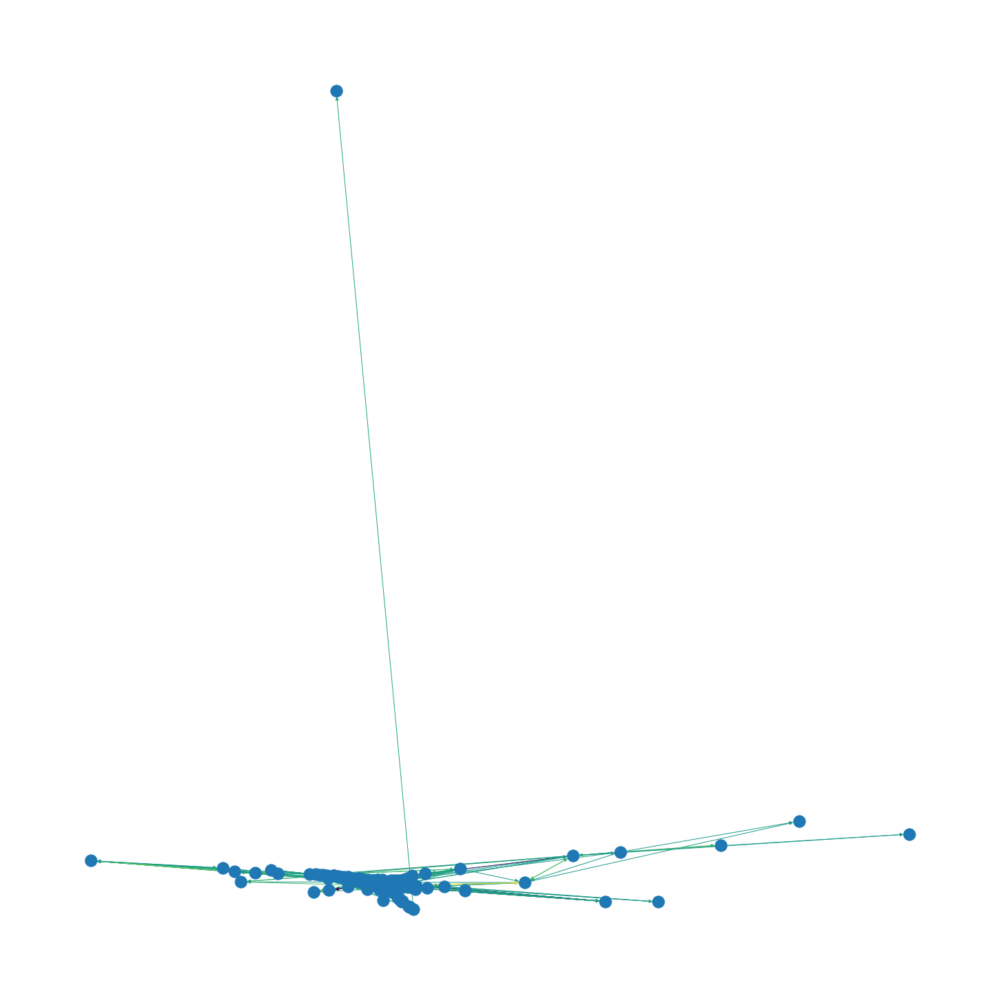

In [ ]:
weights = data2011['Rating'].values
pos = nx.spectral_layout(graph2011)
plt.figure(figsize=(20,20))
nx.draw(graph2011, pos, edge_color=weights, with_labels=False)
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/2011_spectral.png')

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



74
0.09566122667171502
0.21846494853742546


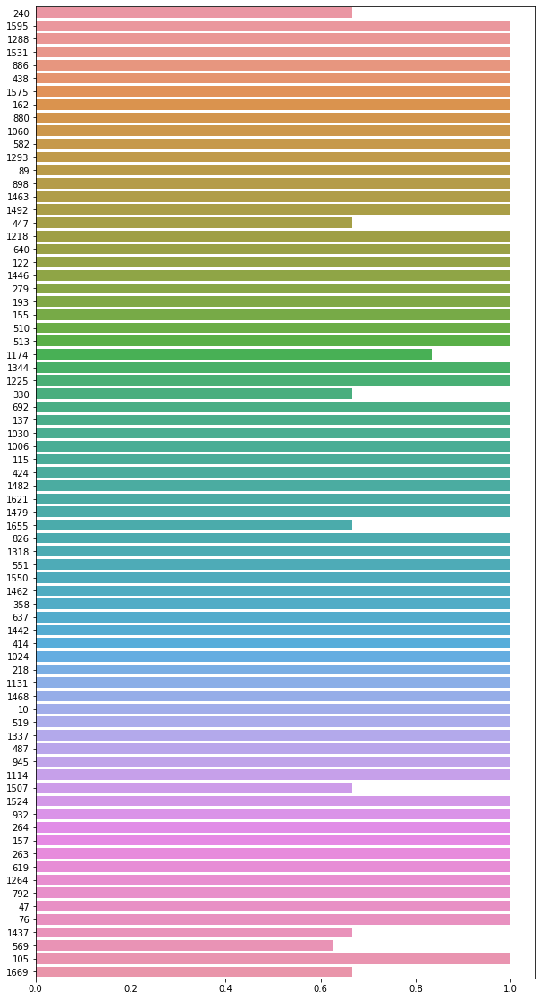

In [ ]:
cluster2011 = nx.clustering(graph2011)
cluster11={}
values=[]
for key,value in cluster2011.items():
  if value >= 0.6:
    cluster11[key]=value
  values.append(value)

plt.figure(figsize=(10,20))
sns.barplot(list(cluster11.values()), list(cluster11.keys()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/cluster2011.png')
print(len(cluster11))
print(np.mean(values))
print(np.std(values))

In [ ]:
print(nx.is_strongly_connected(graph2011))
print(nx.is_weakly_connected(graph2011))

False
False


In [ ]:
negative2011 = data2011[data2011['Rating']<0]
negative2011.head()

,Source,Target,Rating,Time,edges,Date,Year,Month,Day
596,104,179,-1,01:07:16.369130,"(104, 179, -1)",2011-03-22,2011,3,22
597,200,179,-1,01:08:58.390130,"(200, 179, -1)",2011-03-22,2011,3,22
598,149,179,-1,01:11:01.617230,"(149, 179, -1)",2011-03-22,2011,3,22
632,7,179,-1,05:55:57.197670,"(7, 179, -1)",2011-03-25,2011,3,25
646,135,179,-1,02:38:53.061730,"(135, 179, -1)",2011-03-27,2011,3,27


In [ ]:
negative_edges2011 = negative2011['edges'].values
print(len(negative_edges2011))

155


In [ ]:
graph2011_neg = nx.DiGraph()
nodes = list(set(data2011['Source'].values).union(set(data2011['Target'].values)))
graph2011_neg.add_nodes_from(nodes)
graph2011_neg.add_weighted_edges_from(negative_edges2011)

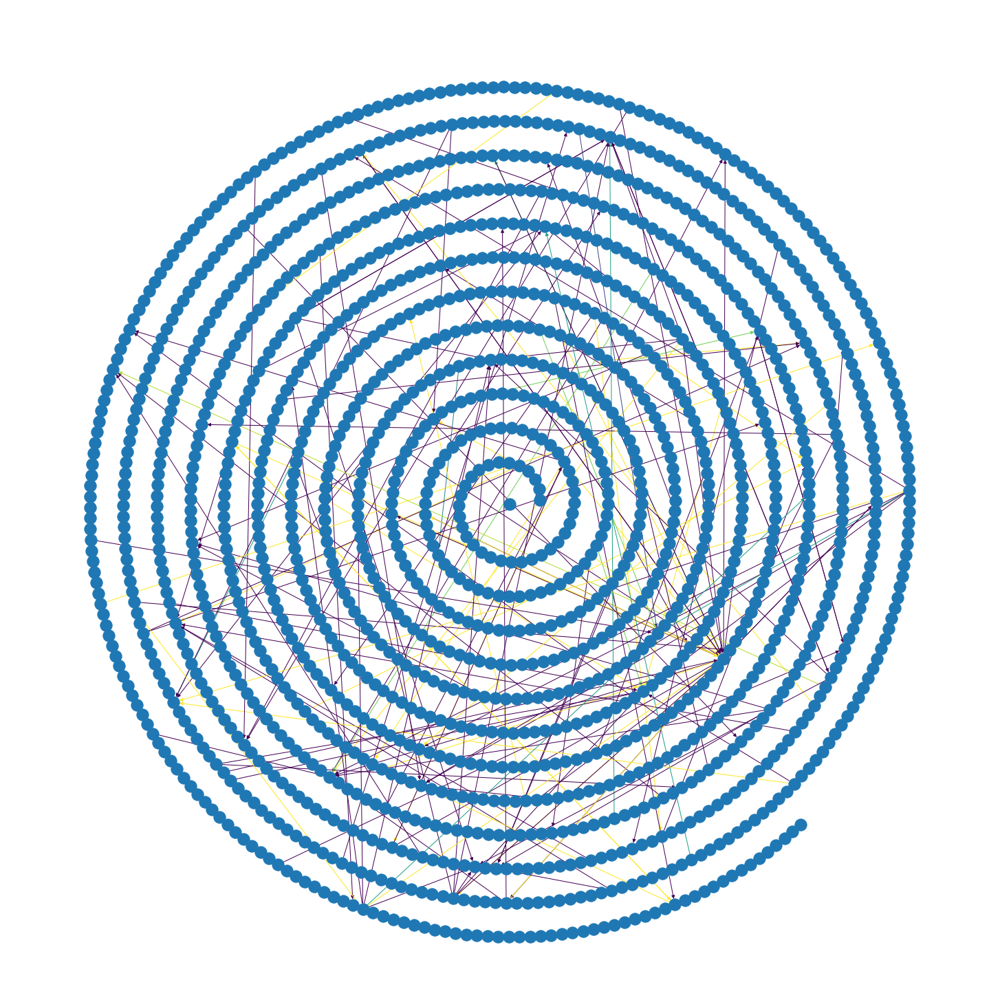

In [ ]:
weights = negative2011['Rating'].values
pos = nx.spiral_layout(graph2011_neg, equidistant = True)
plt.figure(figsize=(20,20))
nx.draw(graph2011_neg, pos, edge_color=weights, with_labels=False)
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/2011_spiral_neg.png')

In [ ]:
ricevuti_2011 = pd.DataFrame()
grouped = data2011.groupby('Target')

In [ ]:
ricevuti_2011['mean']= grouped['Rating'].mean()
ricevuti_2011.head()

,mean
Target,
1,2.938776
10,5.500000
100,1.285714
1000,2.000000
1001,1.600000


In [ ]:
ricevuti_2011 = ricevuti_2011[(ricevuti_2011['mean']>=5)| (ricevuti_2011['mean']<=-5) ]

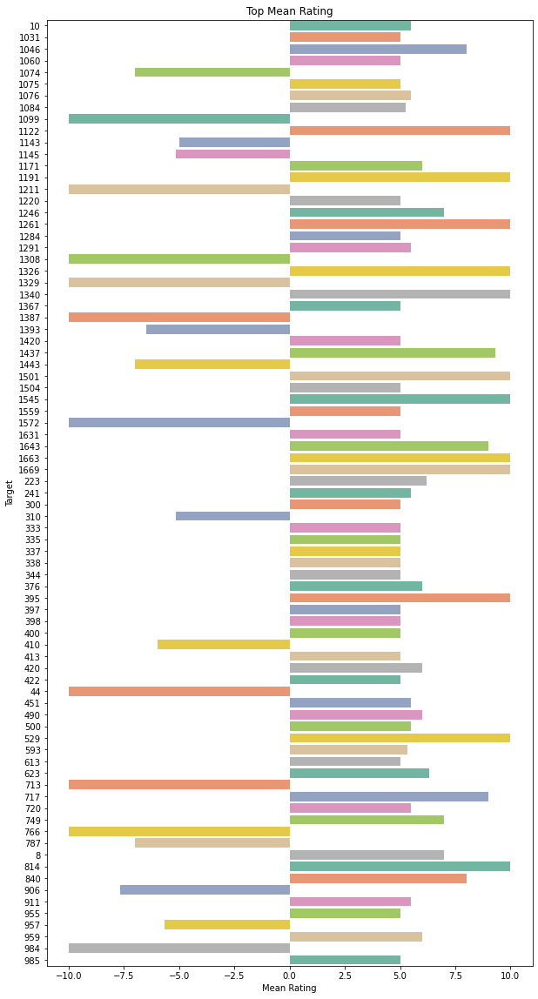

In [ ]:
plt.figure(figsize=(10,20))
sns.barplot(data = ricevuti_2011,y=ricevuti_2011.index, x='mean', palette="Set2",orient = "h")
plt.xlabel("Mean Rating")
plt.ylabel("Target")
plt.title("Top Mean Rating")
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/Ricevuti_2011.png')

In [ ]:
inviati_2011 = pd.DataFrame()
grouped = data2011.groupby('Source')
inviati_2011['mean']= grouped['Rating'].mean()
inviati_2011.head()

,mean
Source,
1,2.457143
10,8.000000
100,1.666667
1000,2.000000
1001,1.600000


In [ ]:
inviati_2011 = inviati_2011[(inviati_2011['mean']>=5)| (inviati_2011['mean']<=-5) ]

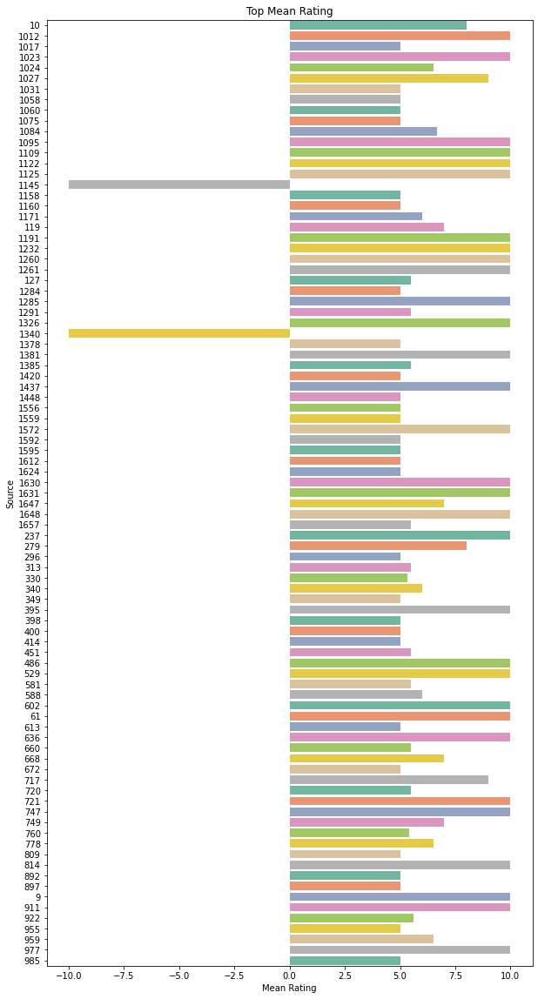

In [ ]:
plt.figure(figsize=(10,20))
sns.barplot(data = inviati_2011,y=inviati_2011.index, x='mean', palette="Set2",orient = "h")
plt.xlabel("Mean Rating")
plt.ylabel("Source")
plt.title("Top Mean Rating")
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/inviati_2011.png')

In [ ]:
bet2011 = nx.betweenness_centrality(graph2011)

In [ ]:
bet11={}
values=[]
for key,value in bet2011.items():
  if value >= 0.03:
    bet11[key]=value
  values.append(value)
print(len(bet11))
print(np.mean(values))
print(np.std(values))

13
0.0016041310761815571
0.007108782136519758


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



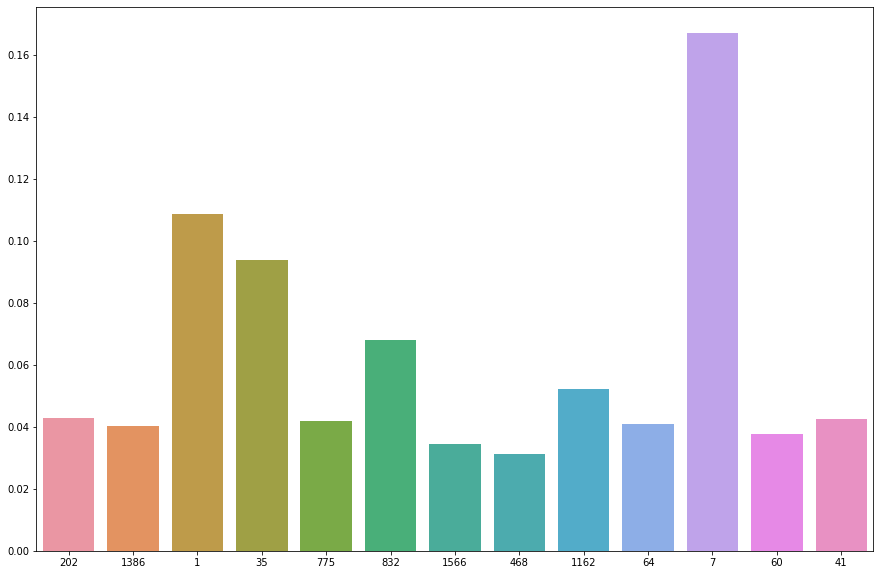

In [ ]:
plt.figure(figsize=(15,10))
sns.barplot(list(bet11.keys()), list(bet11.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/betweenness_centrality2011.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



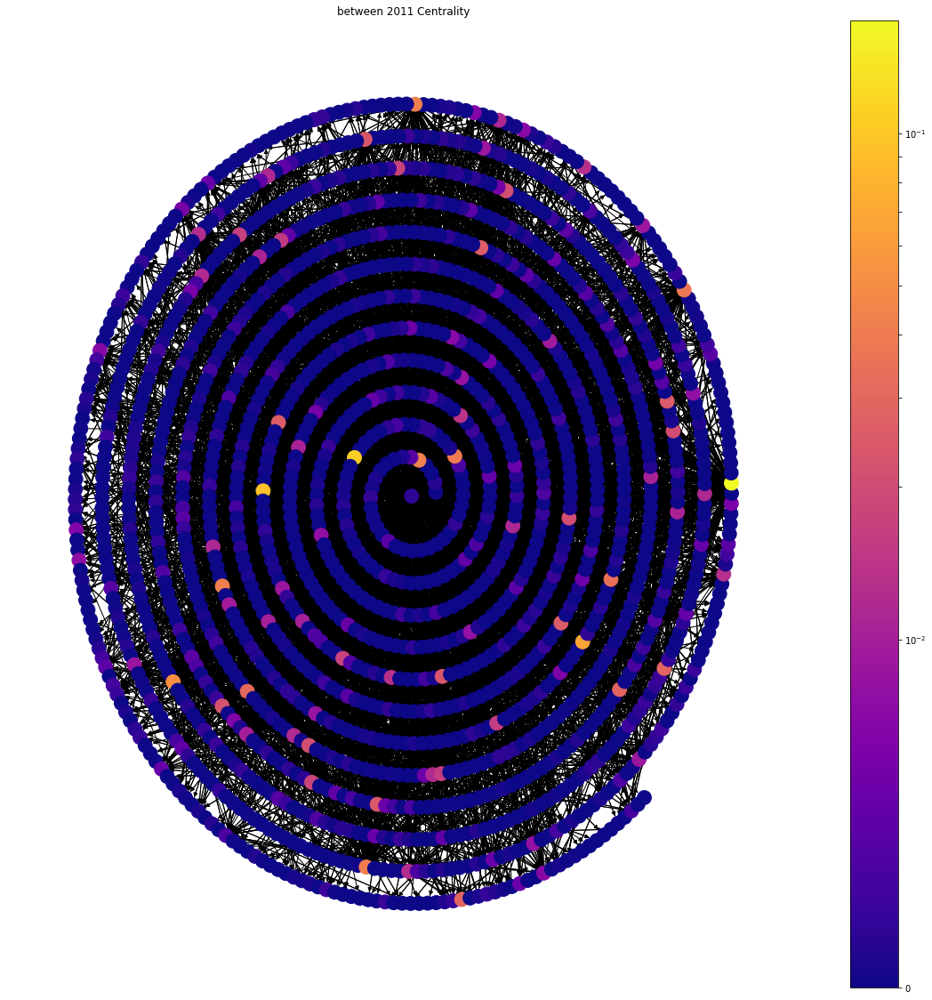

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2011, equidistant = True)
draw(graph2011, pos, bet2011, 'between 2011 Centrality')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/betweenness_centrality_GRAPH2011.png')

In [ ]:
clos2011 = nx.closeness_centrality(graph2011)
clos11={}
values=[]
for key,value in clos2011.items():
  if value <= 0.15:
    clos11[key]=value
  values.append(value)
print(len(clos11))
print(np.mean(values))
print(np.std(values))

17
0.23530302318172233
0.03659713987362734


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



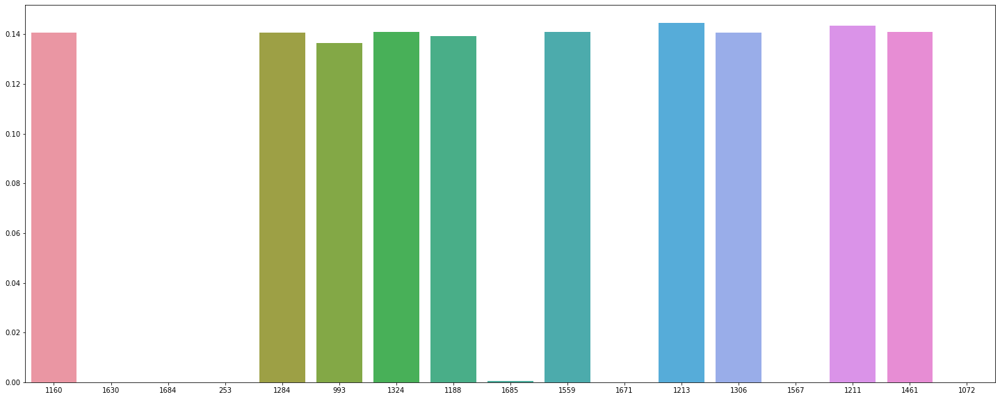

In [ ]:
plt.figure(figsize=(25,10))
sns.barplot(list(clos11.keys()), list(clos11.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/closweenness_centrality2011.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



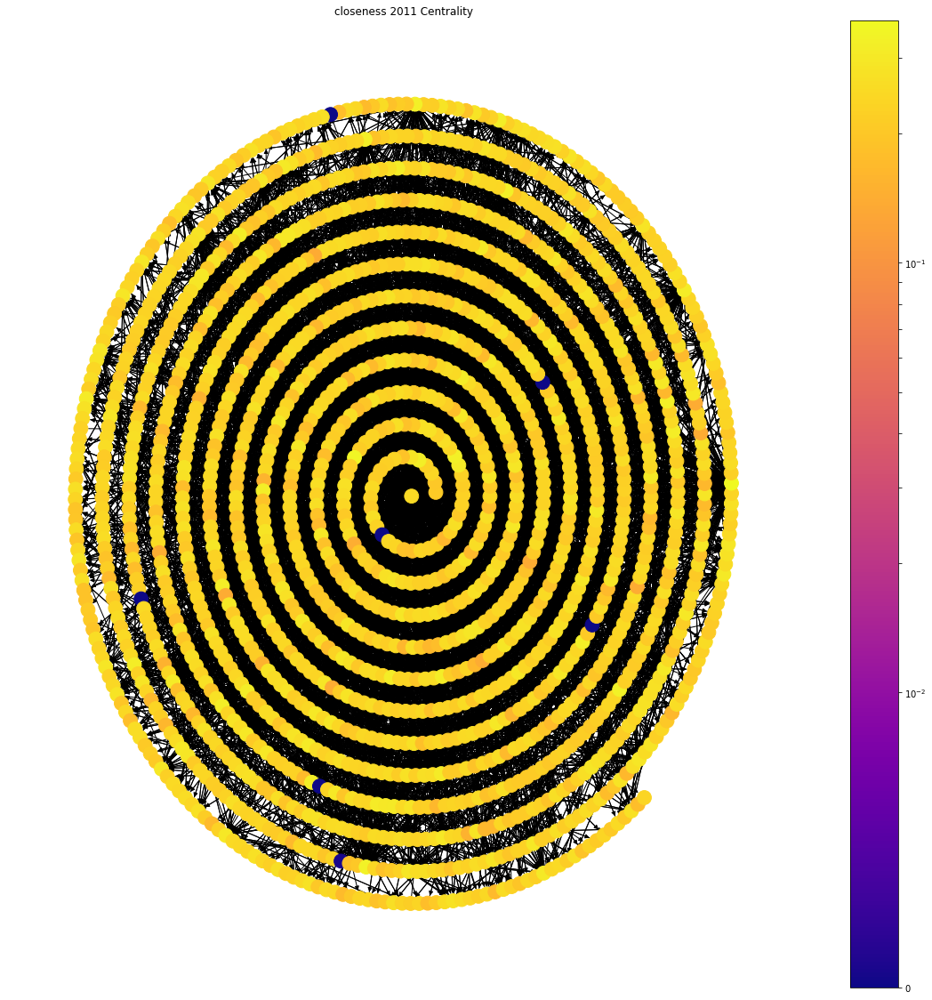

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2011, equidistant = True)
draw(graph2011, pos, clos2011, 'closeness 2011 Centrality')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/closeness_centrality_GRAPH2011.png')

In [ ]:
degree2011 = nx.degree_centrality(graph2011)
degree11={}
values = []
for key,value in degree2011.items():
  if value >= 0.03:
    degree11[key]=value
  values.append(value)

print(len(degree11))
print(np.mean(values))
print(np.std(values))

52
0.005879499810534294
0.01175346503099428


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



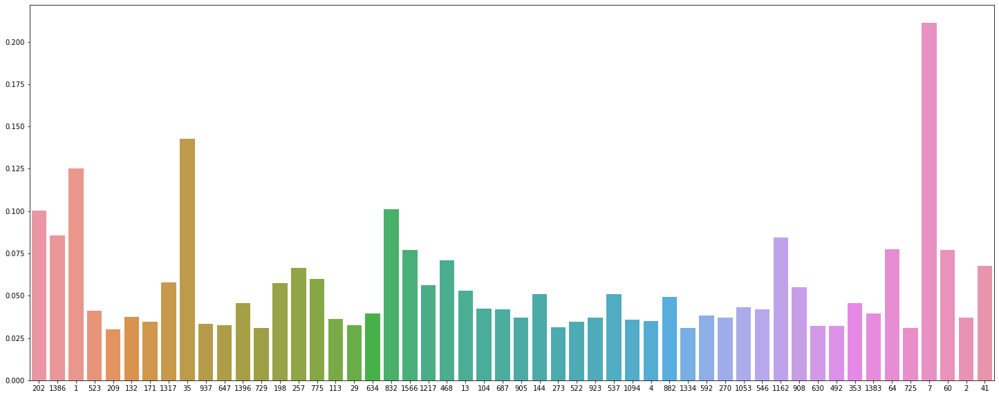

In [ ]:
plt.figure(figsize=(25,10))
sns.barplot(list(degree11.keys()), list(degree11.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/degree_centrality2011.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



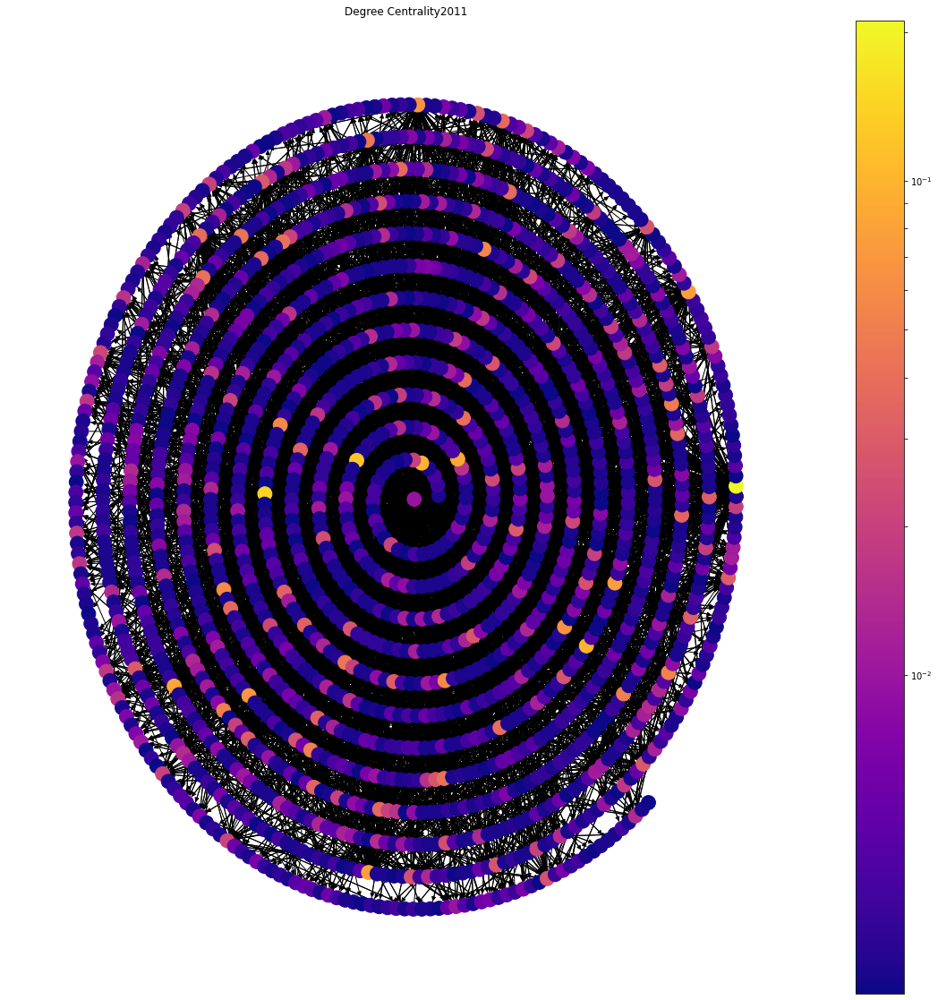

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2011, equidistant=True)
draw(graph2011, pos, degree2011, 'Degree Centrality2011')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/degree_centrality_GRAPH2011.png')

In [ ]:
eige2011 = nx.eigenvector_centrality(graph2011)
eige11={}
values = []
for key,value in eige2011.items():
  if value >= 0.1:
    eige11[key]=value
  values.append(value)

print(len(eige11))
print(np.mean(values))
print(np.std(values))

17
0.012694941188213849
0.021312510026095195


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



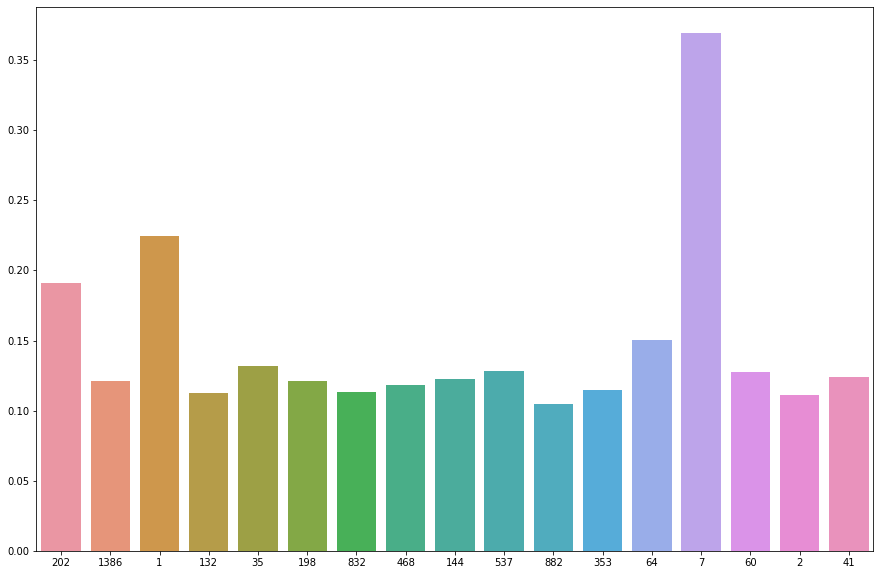

In [ ]:
plt.figure(figsize=(15,10))
sns.barplot(list(eige11.keys()), list(eige11.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/eigenvector_centrality2011.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



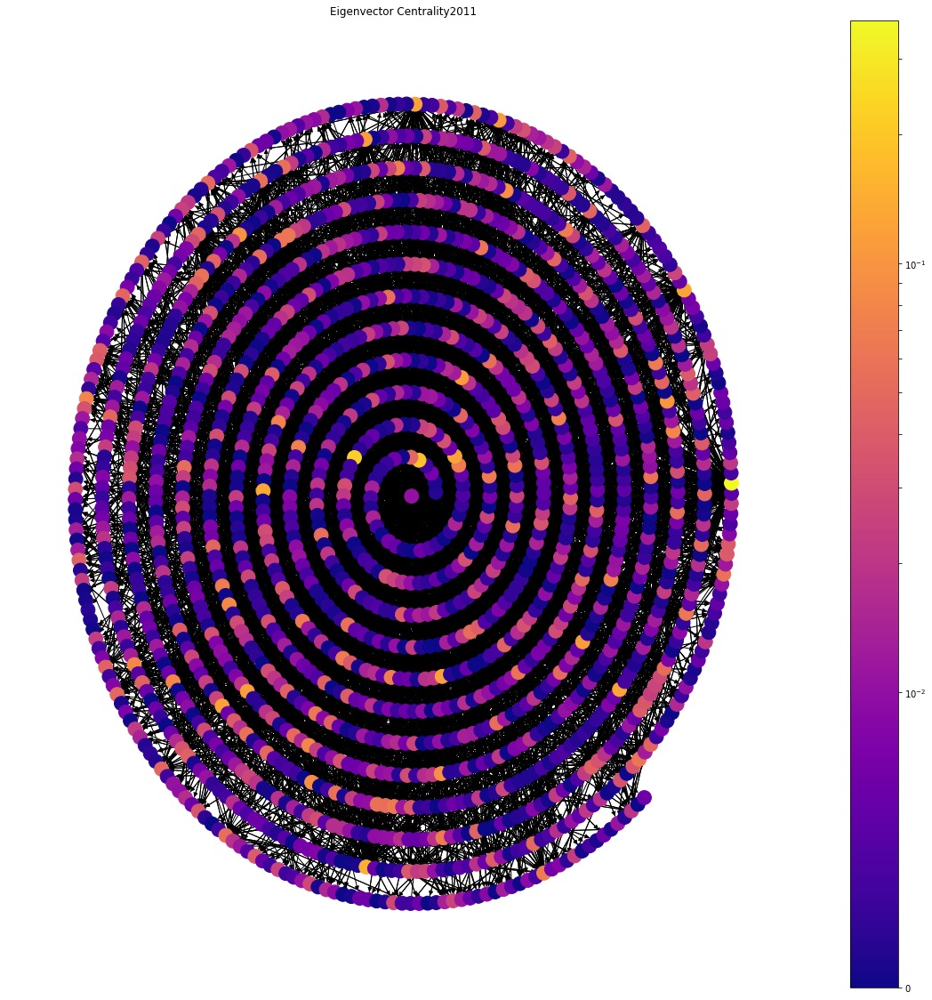

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2011, equidistant=True)
draw(graph2011, pos, eige2011, 'Eigenvector Centrality2011')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/eigenvector_centrality_GRAPH2011.png')

2012

# 2012

In [ ]:
data2012 = pd.DataFrame()
data2012 = data[data['Year']==2012]

In [ ]:
graph2012 = nx.DiGraph()
nodes = list(set(data2012['Source'].values).union(set(data2012['Target'].values)))
graph2012.add_nodes_from(nodes)
graph2012.add_weighted_edges_from(data2012['edges'].values)

In [ ]:
print("NODES: ", len(graph2012.nodes))
print("EDGES: ", len(graph2012.edges))
print("CLUSTERING: ", nx.average_clustering(graph2012))

NODES:  1926
EDGES:  9432
CLUSTERING:  0.11109651949708034


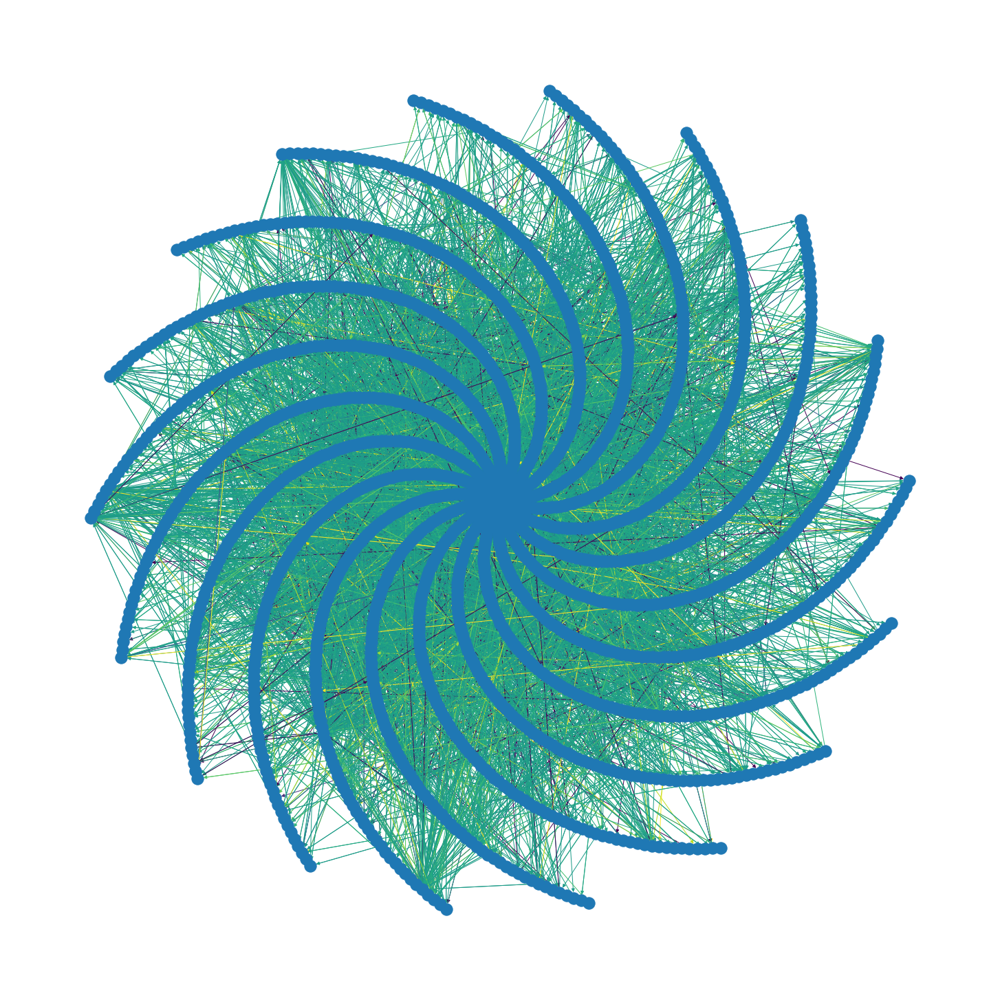

In [ ]:
weights = data2012['Rating'].values
pos = nx.spiral_layout(graph2012)
plt.figure(figsize=(20,20))
nx.draw(graph2012, pos, edge_color=weights, with_labels=False)
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/2012_spiral.png')

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



77
0.11109651949708017
0.21511550548267563


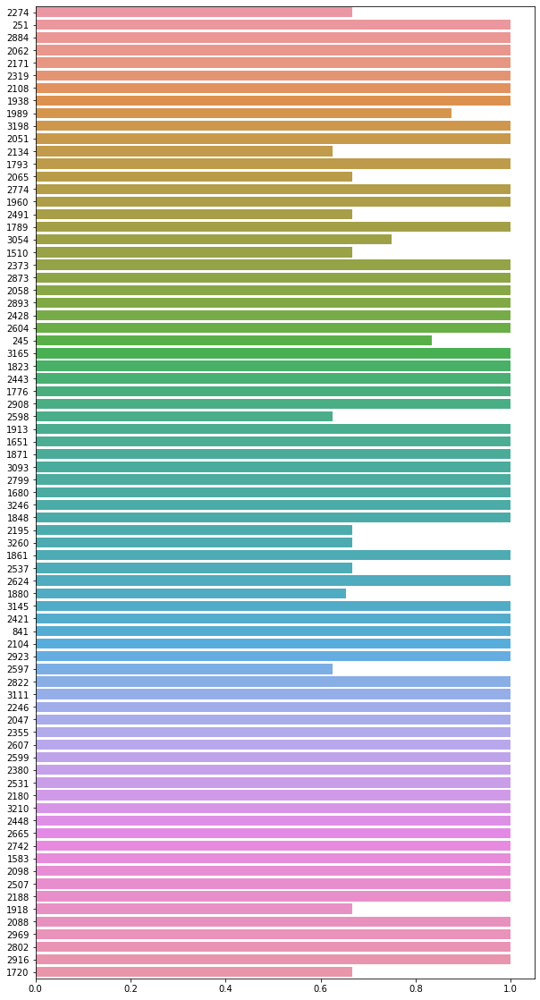

In [ ]:
cluster2012 = nx.clustering(graph2012)
cluster12={}
values=[]
for key,value in cluster2012.items():
  if value >= 0.6:
    cluster12[key]=value
  values.append(value)

plt.figure(figsize=(10,20))
sns.barplot(list(cluster12.values()), list(cluster12.keys()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/cluster2012.png')
print(len(cluster12))
print(np.mean(values))
print(np.std(values))

In [ ]:
print(nx.is_strongly_connected(graph2012))
print(nx.is_weakly_connected(graph2012))

False
False


In [ ]:
negative2012 = data2012[data2012['Rating']<0]
negative2012.head()

,Source,Target,Rating,Time,edges,Date,Year,Month,Day
7936,1692,1647,-1,15:12:18.963430,"(1692, 1647, -1)",2012-01-03,2012,1,3
7938,647,1647,-1,15:41:38.317710,"(647, 1647, -1)",2012-01-03,2012,1,3
7943,1647,309,-10,19:40:52.768160,"(1647, 309, -10)",2012-01-04,2012,1,4
7959,1655,1690,-1,16:44:41.266270,"(1655, 1690, -1)",2012-01-05,2012,1,5
7984,937,1609,-10,03:17:25.673800,"(937, 1609, -10)",2012-01-07,2012,1,7


In [ ]:
negative_edges2012 = negative2012['edges'].values
print(len(negative_edges2012))

810


In [ ]:
graph2012_neg = nx.DiGraph()
nodes = list(set(data2012['Source'].values).union(set(data2012['Target'].values)))
graph2012_neg.add_nodes_from(nodes)
graph2012_neg.add_weighted_edges_from(negative_edges2012)

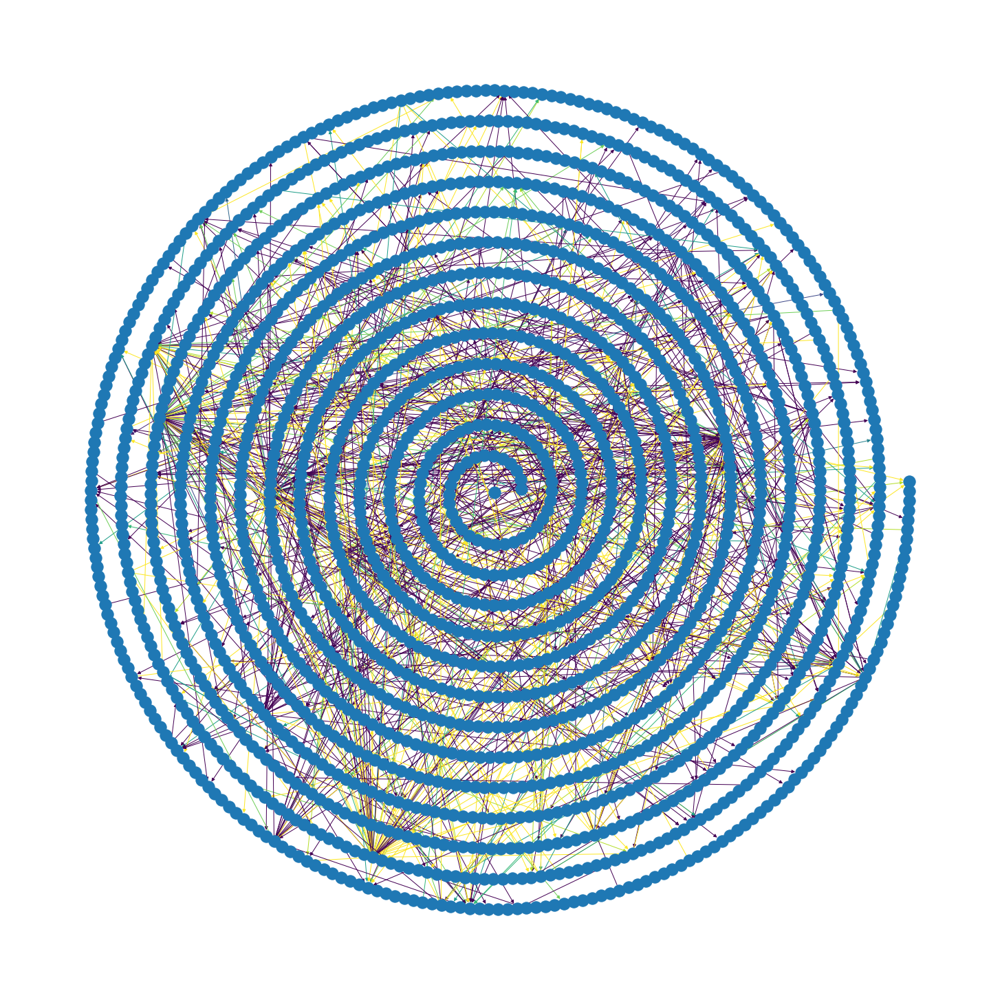

In [ ]:
weights = negative2012['Rating'].values
pos = nx.spiral_layout(graph2012_neg, equidistant = True)
plt.figure(figsize=(20,20))
nx.draw(graph2012_neg, pos, edge_color=weights, with_labels=False)
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/2012_spiral_neg.png')

In [ ]:
ricevuti_2012 = pd.DataFrame()
grouped = data2012.groupby('Target')

In [ ]:
ricevuti_2012['mean']= grouped['Rating'].mean()
ricevuti_2012.head()

,mean
Target,
1,4.644068
10,3.000000
100,1.000000
1001,3.666667
101,3.000000


In [ ]:
ricevuti_2012 = ricevuti_2012[(ricevuti_2012['mean']>=5)| (ricevuti_2012['mean']<=-5) ]

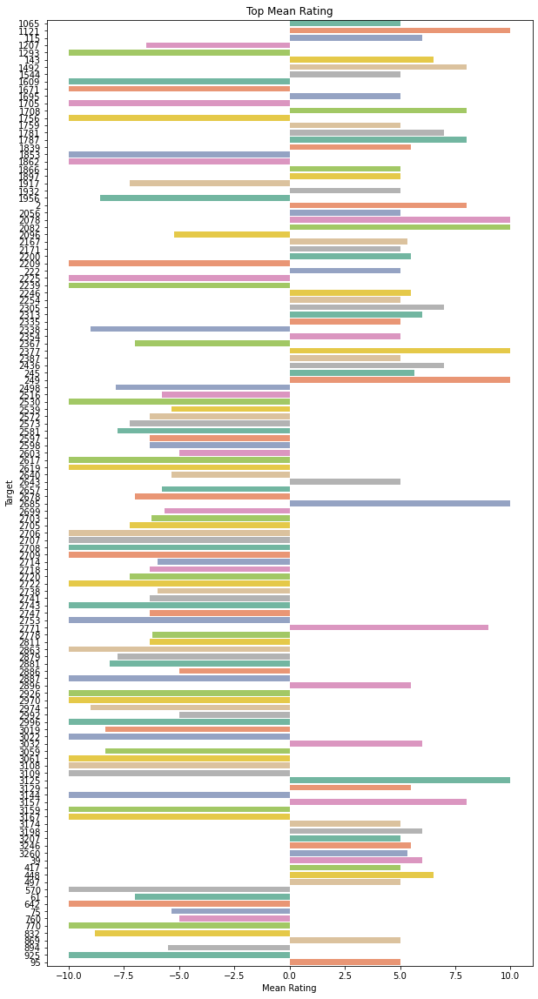

In [ ]:
plt.figure(figsize=(10,20))
sns.barplot(data = ricevuti_2012,y=ricevuti_2012.index, x='mean', palette="Set2",orient = "h")
plt.xlabel("Mean Rating")
plt.ylabel("Target")
plt.title("Top Mean Rating")
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/Ricevuti_2012.png')

In [ ]:
inviati_2012 = pd.DataFrame()
grouped = data2012.groupby('Source')
inviati_2012['mean']= grouped['Rating'].mean()
inviati_2012.head()

,mean
Source,
1,1.461538
100,1.000000
1001,5.000000
1018,1.289474
1028,1.000000


In [ ]:
inviati_2012 = inviati_2012[(inviati_2012['mean']>=5)| (inviati_2012['mean']<=-5) ]

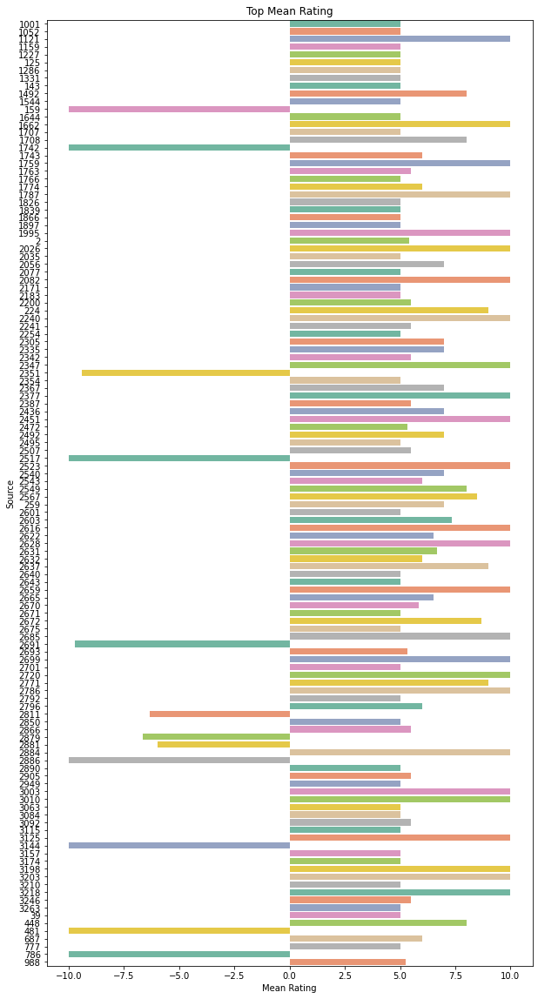

In [ ]:
plt.figure(figsize=(10,20))
sns.barplot(data = inviati_2012,y=inviati_2012.index, x='mean', palette="Set2",orient = "h")
plt.xlabel("Mean Rating")
plt.ylabel("Source")
plt.title("Top Mean Rating")
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/inviati_2012.png')

In [ ]:
bet2012 = nx.betweenness_centrality(graph2012)

In [ ]:
bet12={}
values=[]
for key,value in bet2012.items():
  if value >= 0.03:
    bet12[key]=value
  values.append(value)
print(len(bet12))
print(np.mean(values))
print(np.std(values))

12
0.0010793032288359387
0.005748373288744805


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



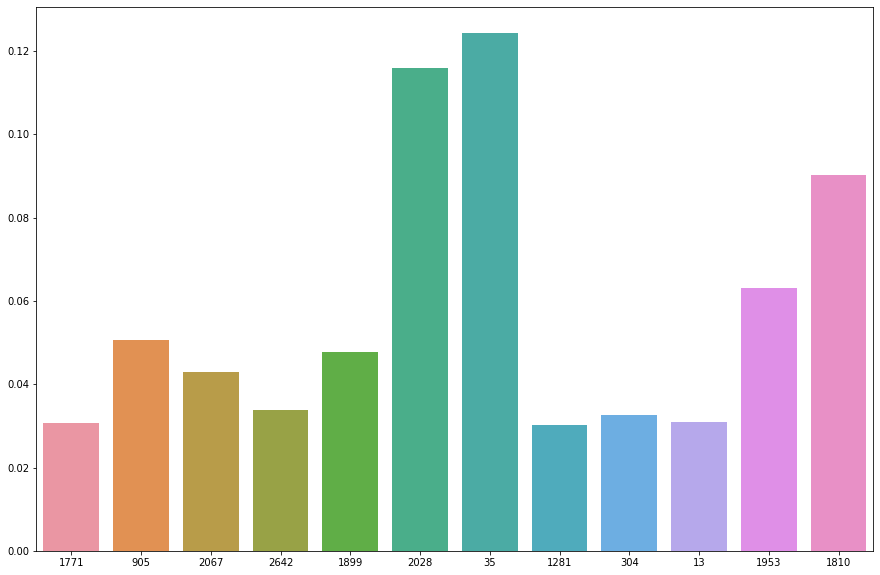

In [ ]:
plt.figure(figsize=(15,10))
sns.barplot(list(bet12.keys()), list(bet12.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/betweenness_centrality2012.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



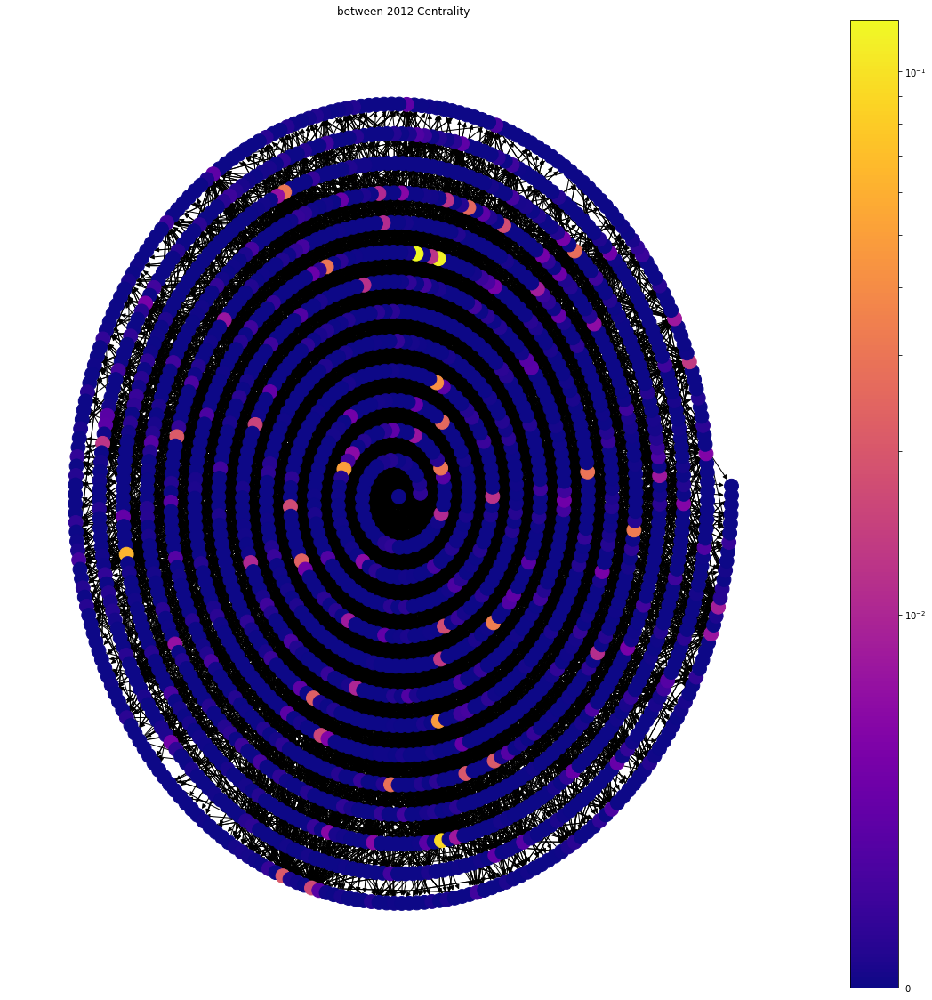

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2012, equidistant = True)
draw(graph2012, pos, bet2012, 'between 2012 Centrality')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/betweenness_centrality_GRAPH2012.png')

In [ ]:
clos2012 = nx.closeness_centrality(graph2012)
clos12={}
values=[]
for key,value in clos2012.items():
  if value <= 0.1:
    clos12[key]=value
  values.append(value)
print(len(clos12))
print(np.mean(values))
print(np.std(values))

38
0.2187433723672581
0.041666375080139054


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



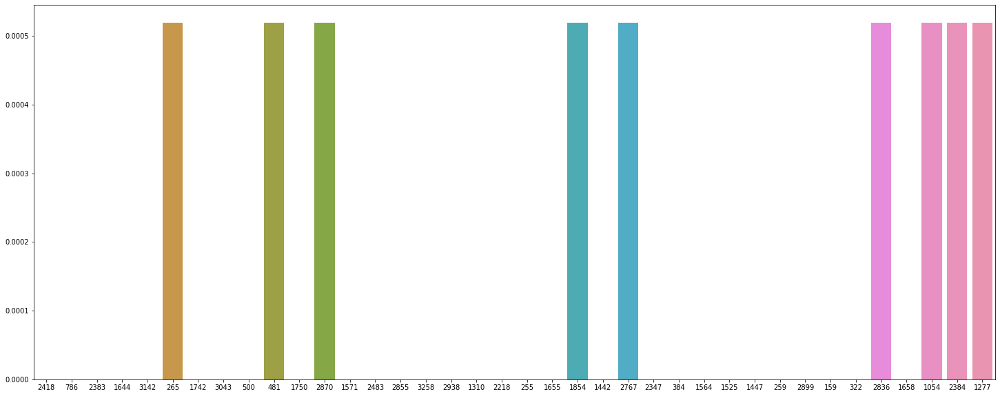

In [ ]:
plt.figure(figsize=(25,10))
sns.barplot(list(clos12.keys()), list(clos12.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/closweenness_centrality2012.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



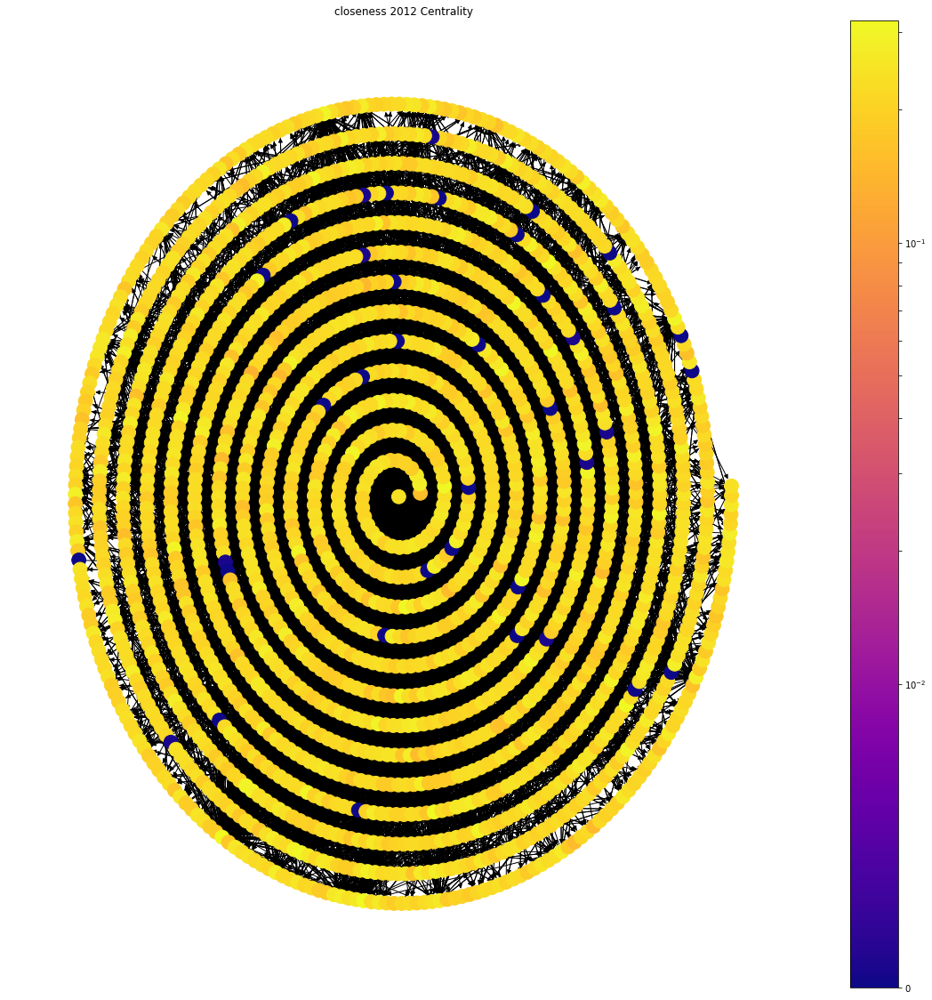

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2012, equidistant = True)
draw(graph2012, pos, clos2012, 'closeness 2012 Centrality')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/closeness_centrality_GRAPH2012.png')

In [ ]:
degree2012 = nx.degree_centrality(graph2012)
degree12={}
values = []
for key,value in degree2012.items():
  if value >= 0.03:
    degree12[key]=value
  values.append(value)

print(len(degree12))
print(np.mean(values))
print(np.std(values))

52
0.0050879961160335
0.012690367111482073


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



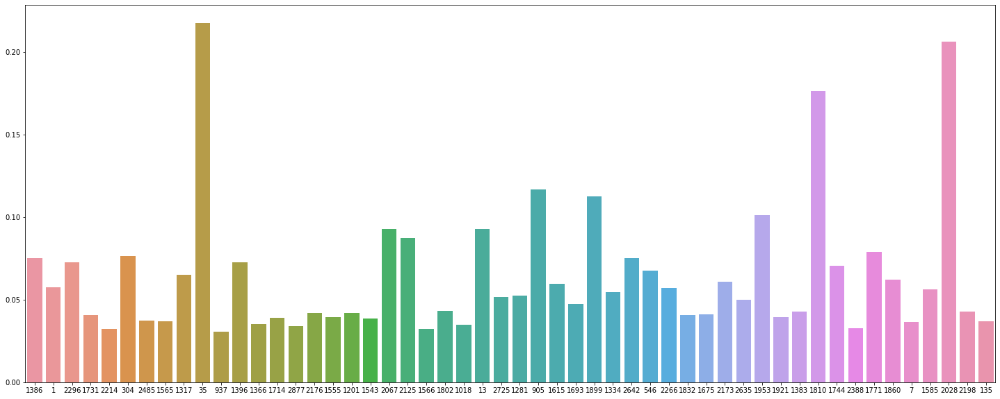

In [ ]:
plt.figure(figsize=(25,10))
sns.barplot(list(degree12.keys()), list(degree12.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/degree_centrality2012.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



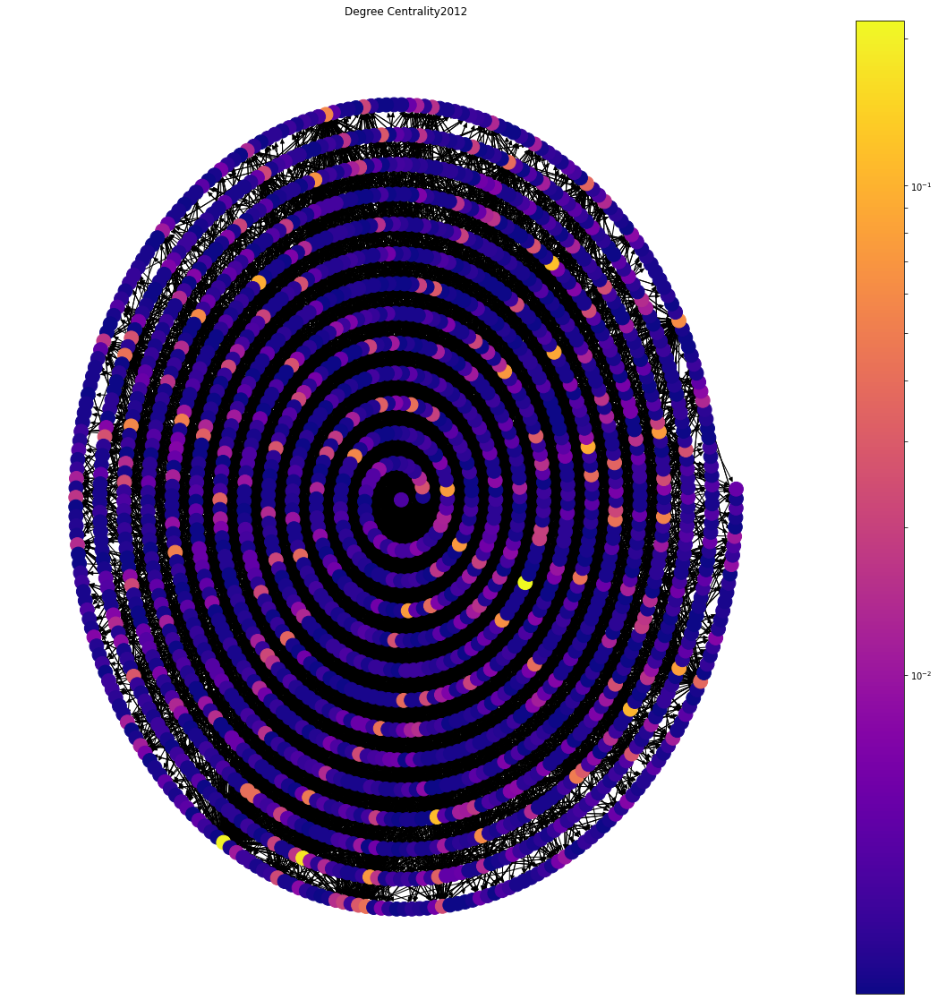

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2012, equidistant=True)
draw(graph2012, pos, degree2012, 'Degree Centrality2012')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/degree_centrality_GRAPH2012.png')

In [ ]:
eige2012 = nx.eigenvector_centrality(graph2012)
eige12={}
values = []
for key,value in eige2012.items():
  if value >= 0.1:
    eige12[key]=value
  values.append(value)

print(len(eige12))
print(np.mean(values))
print(np.std(values))

26
0.011306805749313472
0.019782996318351814


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



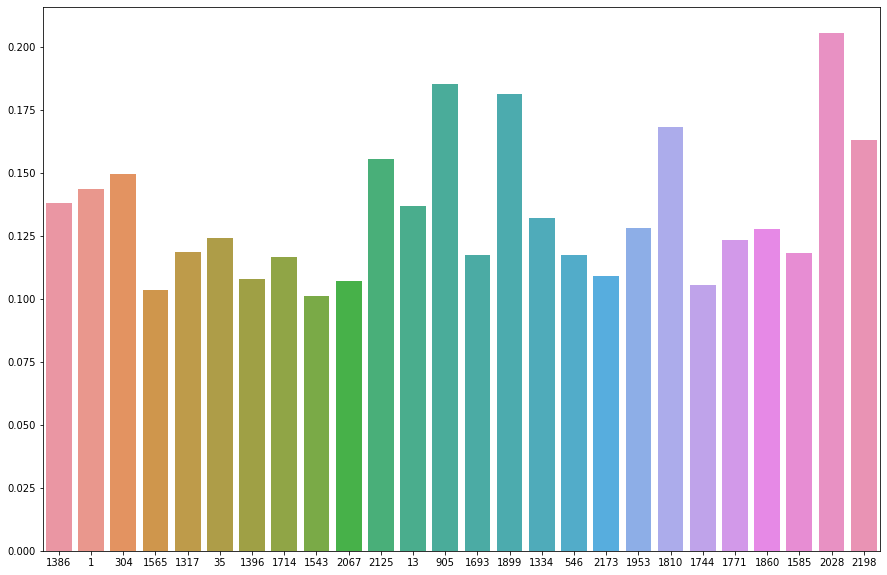

In [ ]:
plt.figure(figsize=(15,10))
sns.barplot(list(eige12.keys()), list(eige12.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/eigenvector_centrality2012.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



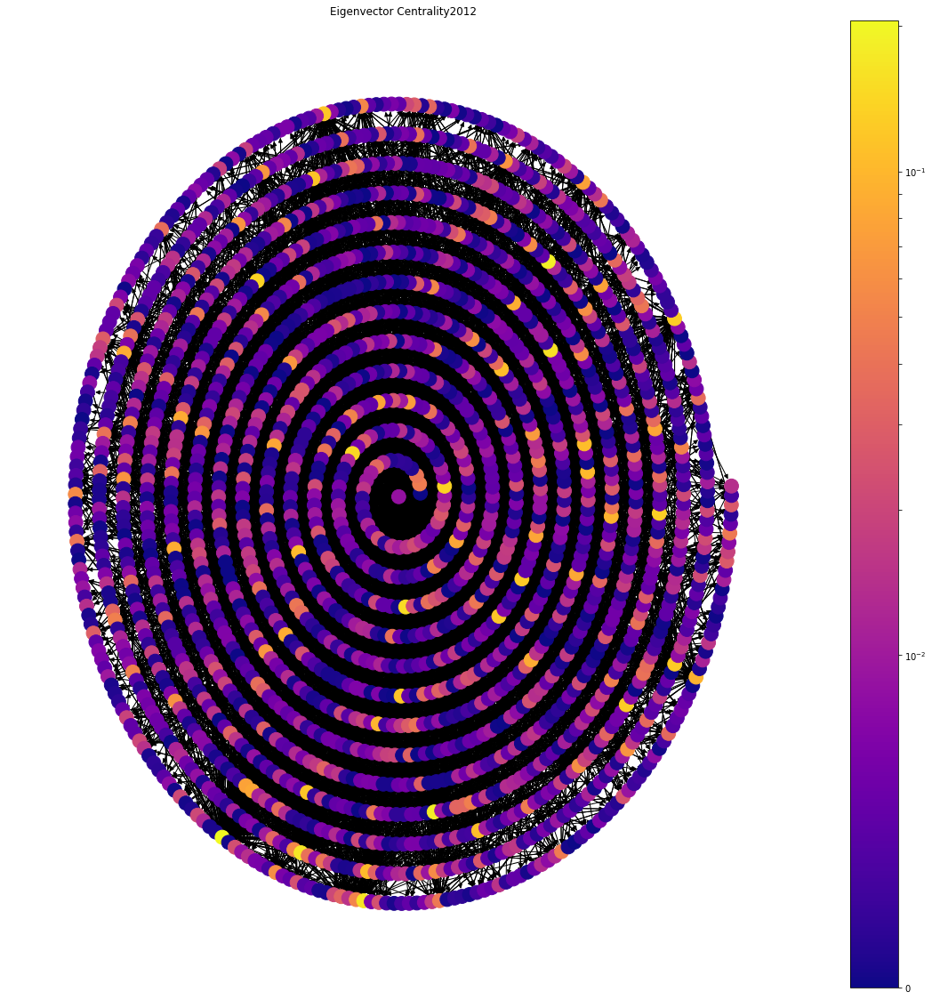

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2012, equidistant=True)
draw(graph2012, pos, eige2012, 'Eigenvector Centrality2012')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/eigenvector_centrality_GRAPH2012.png')

2010

# 2010

In [ ]:
data2010 = pd.DataFrame()
data2010 = data[data['Year']==2010]

In [ ]:
graph2010 = nx.DiGraph()
nodes = list(set(data2010['Source'].values).union(set(data2010['Target'].values)))
graph2010.add_nodes_from(nodes)
graph2010.add_weighted_edges_from(data2010['edges'].values)

In [ ]:
print("NODES: ", len(graph2010.nodes))
print("EDGES: ", len(graph2010.edges))
print("CLUSTERING: ", nx.average_clustering(graph2010))

NODES:  55
EDGES:  142
CLUSTERING:  0.06851898105316458


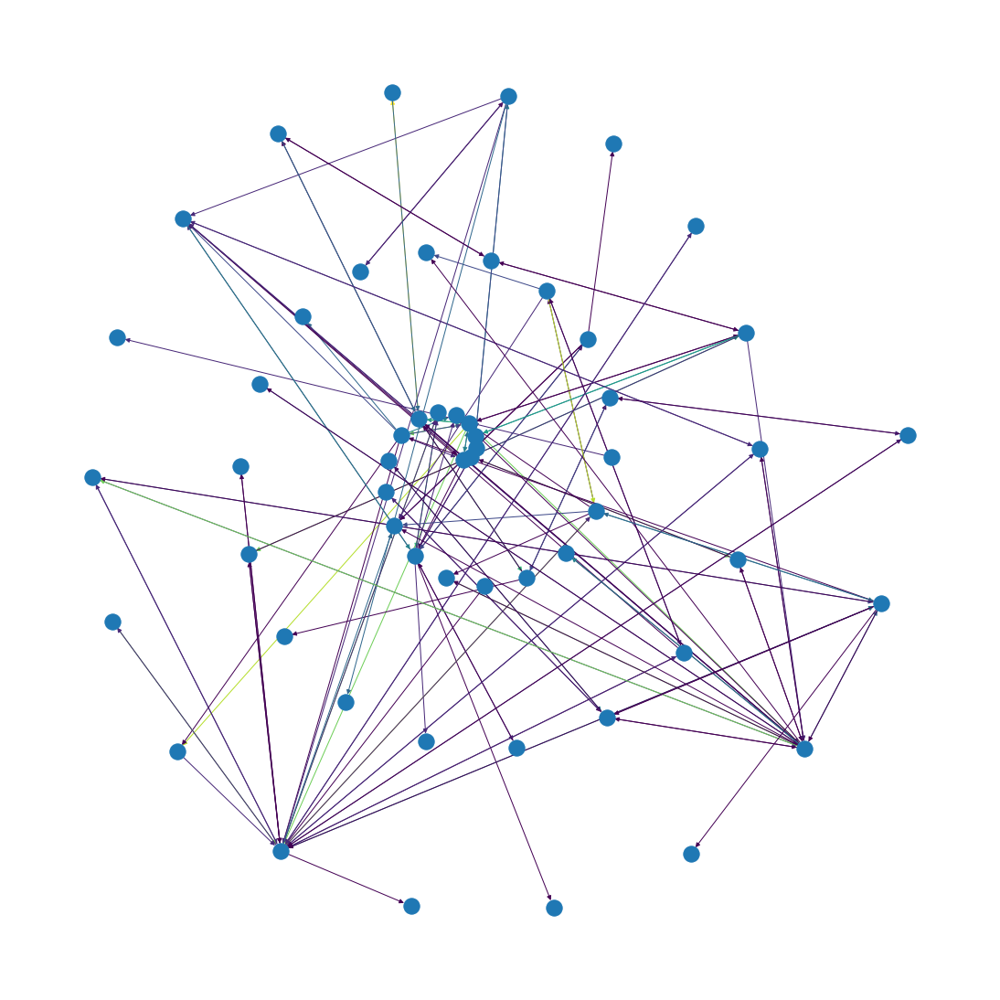

In [ ]:
weights = data2010['Rating'].values
pos = nx.spiral_layout(graph2010)
plt.figure(figsize=(15,15))
nx.draw(graph2010, pos, edge_color=weights)
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/2010_spiral.png')

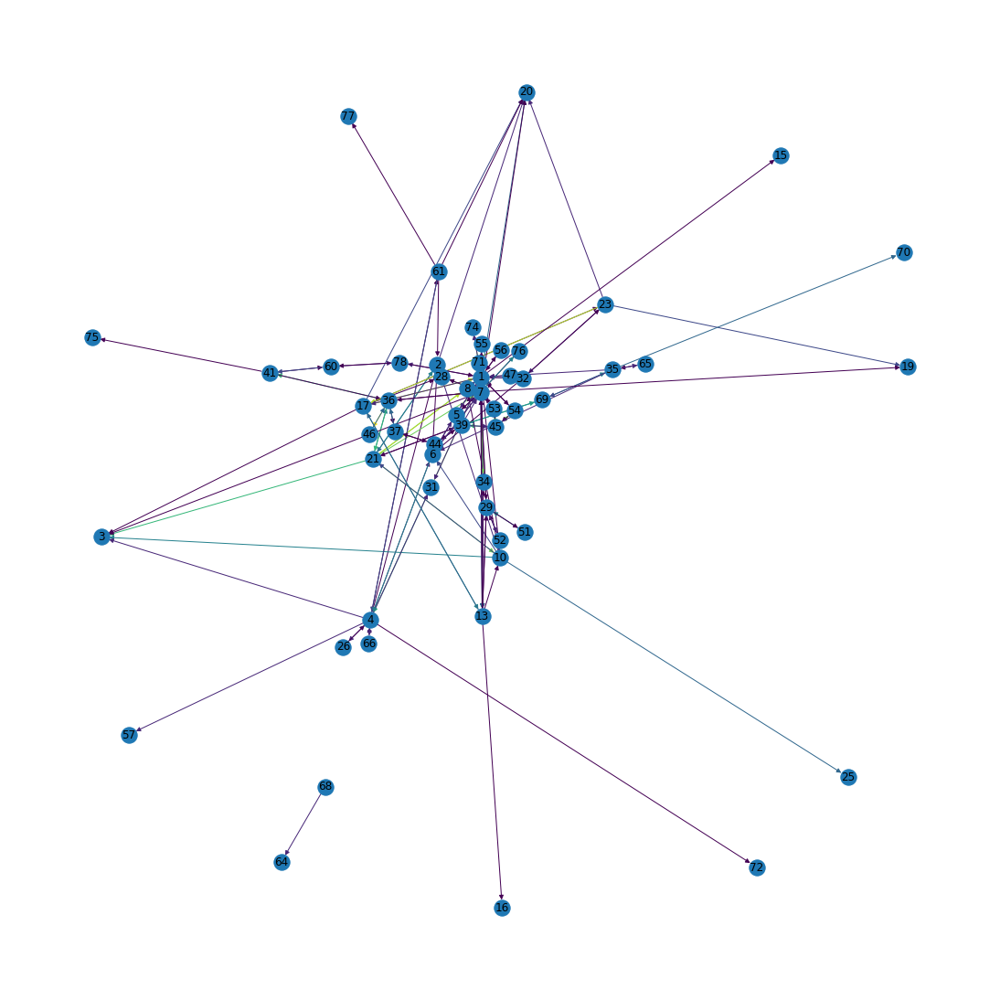

In [ ]:
weights = data2010['Rating'].values
pos = nx.spring_layout(graph2010)
plt.figure(figsize=(15,15))
nx.draw(graph2010, pos, edge_color=weights, with_labels=True)
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/2010_spectral.png')

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



55
0.06851898105316456
0.14224027142970636


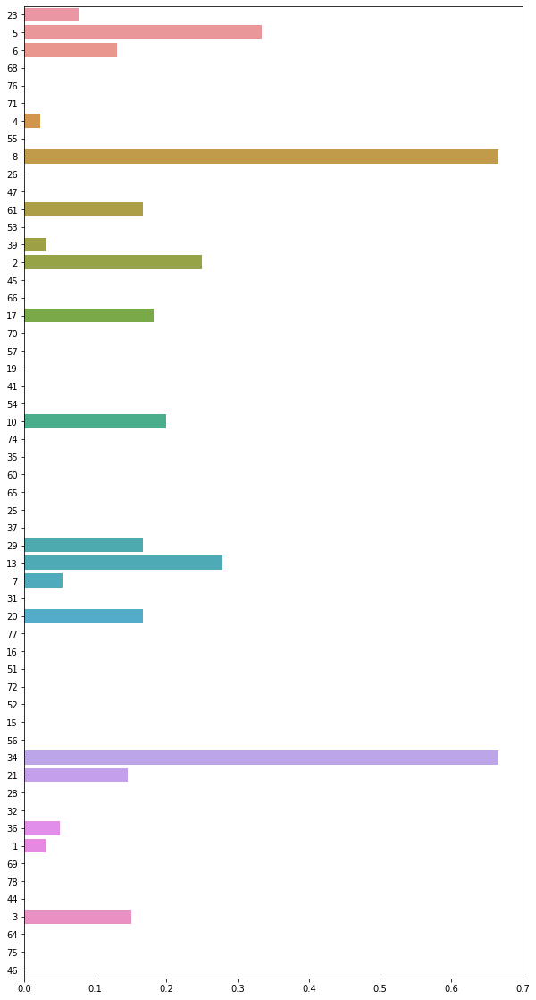

In [ ]:
cluster2010 = nx.clustering(graph2010)
cluster10={}
values=[]
for key,value in cluster2010.items():
  if value >= 0:
    cluster10[key]=value
  values.append(value)

plt.figure(figsize=(10,20))
sns.barplot(list(cluster10.values()), list(cluster10.keys()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/cluster2010.png')
print(len(cluster10))
print(np.mean(values))
print(np.std(values))

In [ ]:
print(nx.is_strongly_connected(graph2010))
print(nx.is_weakly_connected(graph2010))

False
False


In [ ]:
negative2010 = data2010[data2010['Rating']<0]
negative2010.head()

,Source,Target,Rating,Time,edges,Date,Year,Month,Day


In [ ]:
negative_edges2010 = negative2010['edges'].values
print(len(negative_edges2010))

0


In [ ]:
graph2010_neg = nx.DiGraph()
nodes = list(set(data2010['Source'].values).union(set(data2010['Target'].values)))
graph2010_neg.add_nodes_from(nodes)
graph2010_neg.add_weighted_edges_from(negative_edges2010)

In [ ]:
ricevuti_2010 = pd.DataFrame()
grouped = data2010.groupby('Target')

In [ ]:
ricevuti_2010['mean']= grouped['Rating'].mean()
ricevuti_2010.head()

,mean
Target,
1,3.75
10,8.00
13,1.80
15,1.00
16,8.00


In [ ]:
ricevuti_2010 = ricevuti_2010[(ricevuti_2010['mean']>=5)| (ricevuti_2010['mean']<=-5) ]

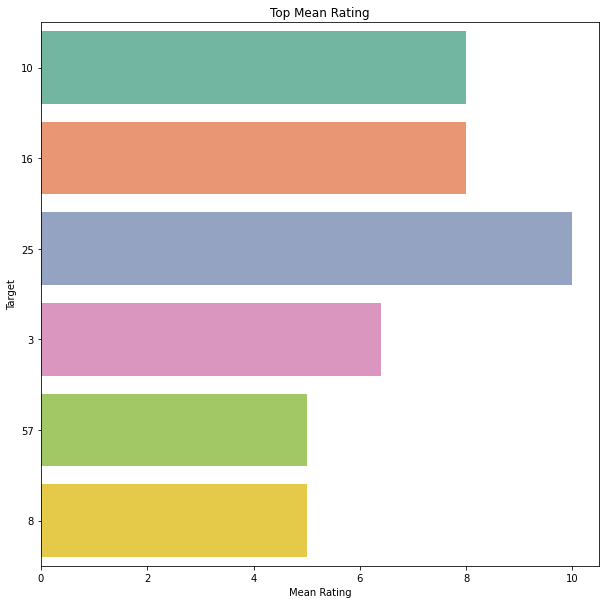

In [ ]:
plt.figure(figsize=(10,10))
sns.barplot(data = ricevuti_2010,y=ricevuti_2010.index, x='mean', palette="Set2",orient = "h")
plt.xlabel("Mean Rating")
plt.ylabel("Target")
plt.title("Top Mean Rating")
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/Ricevuti_2010.png')

In [ ]:
inviati_2010 = pd.DataFrame()
grouped = data2010.groupby('Source')
inviati_2010['mean']= grouped['Rating'].mean()
inviati_2010.head()

,mean
Source,
1,2.230769
10,6.857143
13,4.285714
17,3.333333
2,5.000000


In [ ]:
inviati_2010 = inviati_2010[(inviati_2010['mean']>=5)| (inviati_2010['mean']<=-5) ]

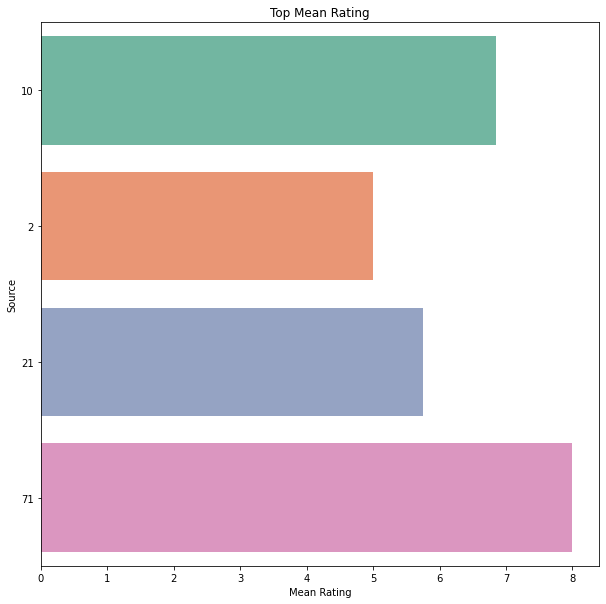

In [ ]:
plt.figure(figsize=(10,10))
sns.barplot(data = inviati_2010,y=inviati_2010.index, x='mean', palette="Set2",orient = "h")
plt.xlabel("Mean Rating")
plt.ylabel("Source")
plt.title("Top Mean Rating")
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/inviati_2010.png')

In [ ]:
bet2010 = nx.betweenness_centrality(graph2010)

In [ ]:
bet10={}
values=[]
for key,value in bet2010.items():
  if value >= 0:
    bet10[key]=value
  values.append(value)
print(len(bet10))
print(np.mean(values))
print(np.std(values))

55
0.03048726256273426
0.05507983045878582


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



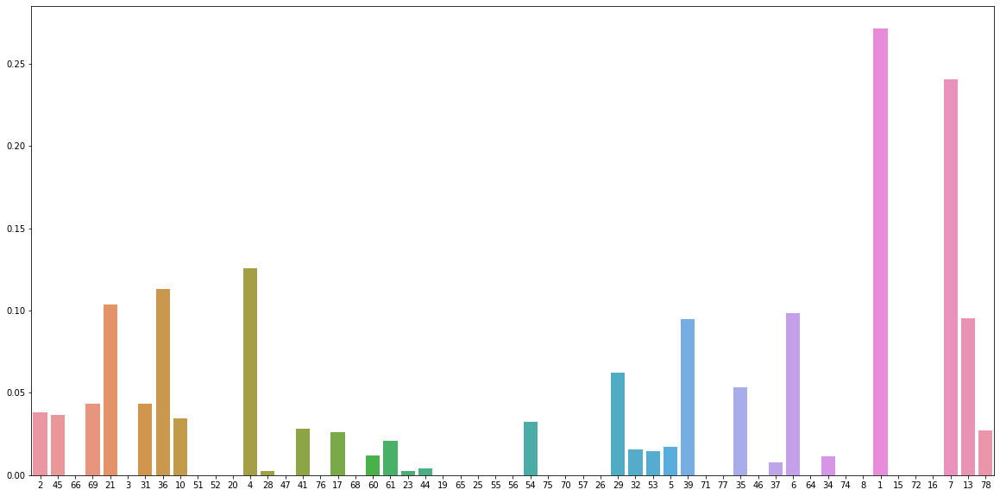

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(list(bet10.keys()), list(bet10.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/betweenness_centrality2010.png')

In [ ]:
def draw2(G, pos, measures, measure_name):
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=250, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1))
    
    labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



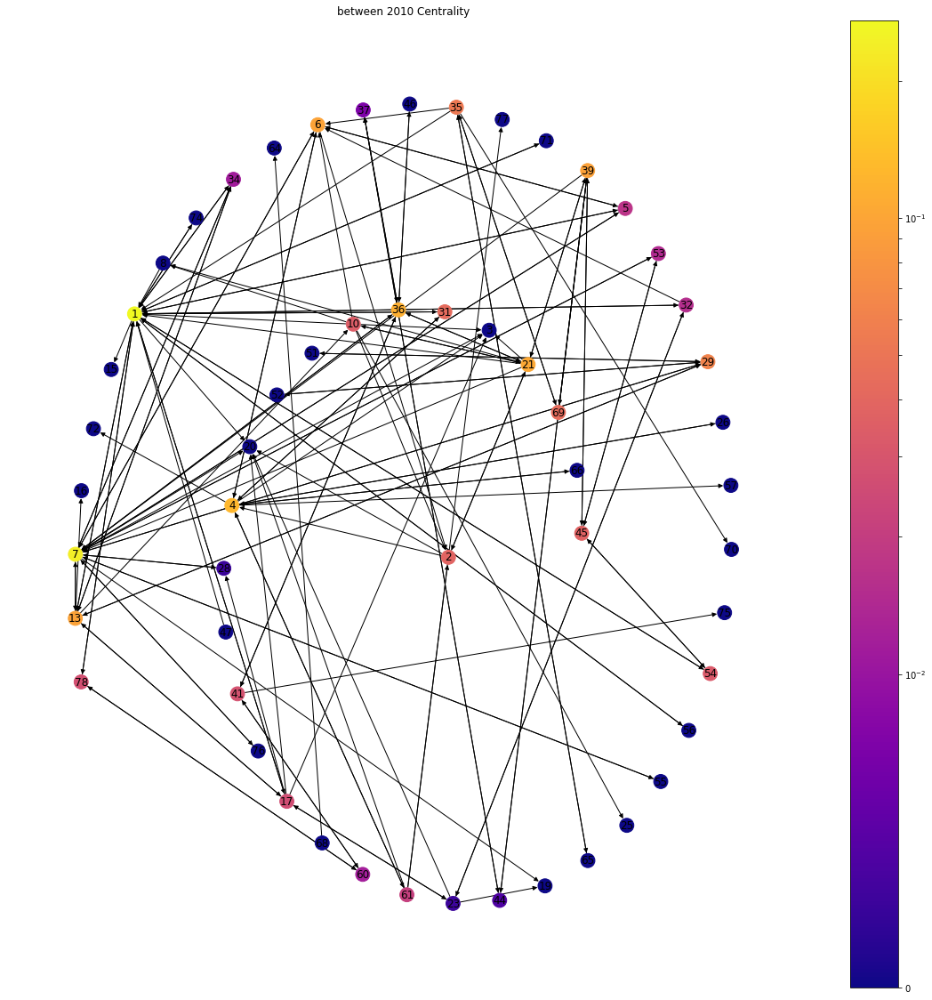

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2010, equidistant = True)
draw2(graph2010, pos, bet2010, 'between 2010 Centrality')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/betweenness_centrality_GRAPH2010.png')

In [ ]:
clos2010 = nx.closeness_centrality(graph2010)
clos10={}
values=[]
for key,value in clos2010.items():
  if value >= 0:
    clos10[key]=value
  values.append(value)
print(len(clos10))
print(np.mean(values))
print(np.std(values))

55
0.23650845109501403
0.07847717509697792


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



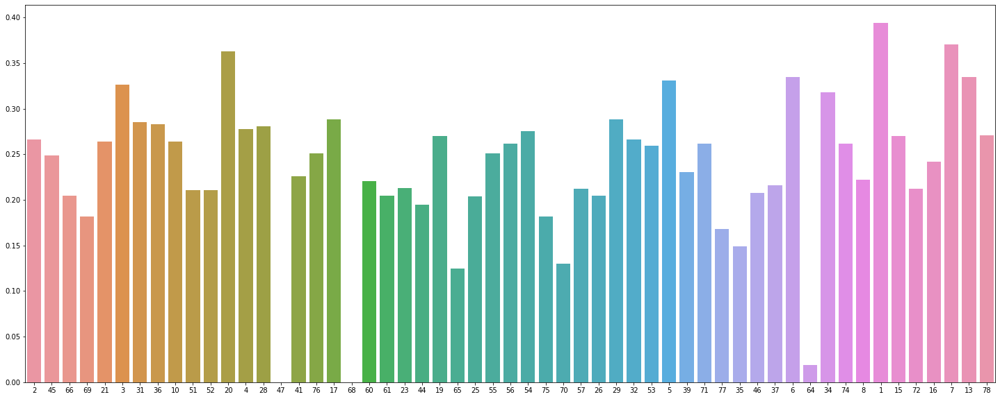

In [ ]:
plt.figure(figsize=(25,10))
sns.barplot(list(clos10.keys()), list(clos10.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/closweenness_centrality2010.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



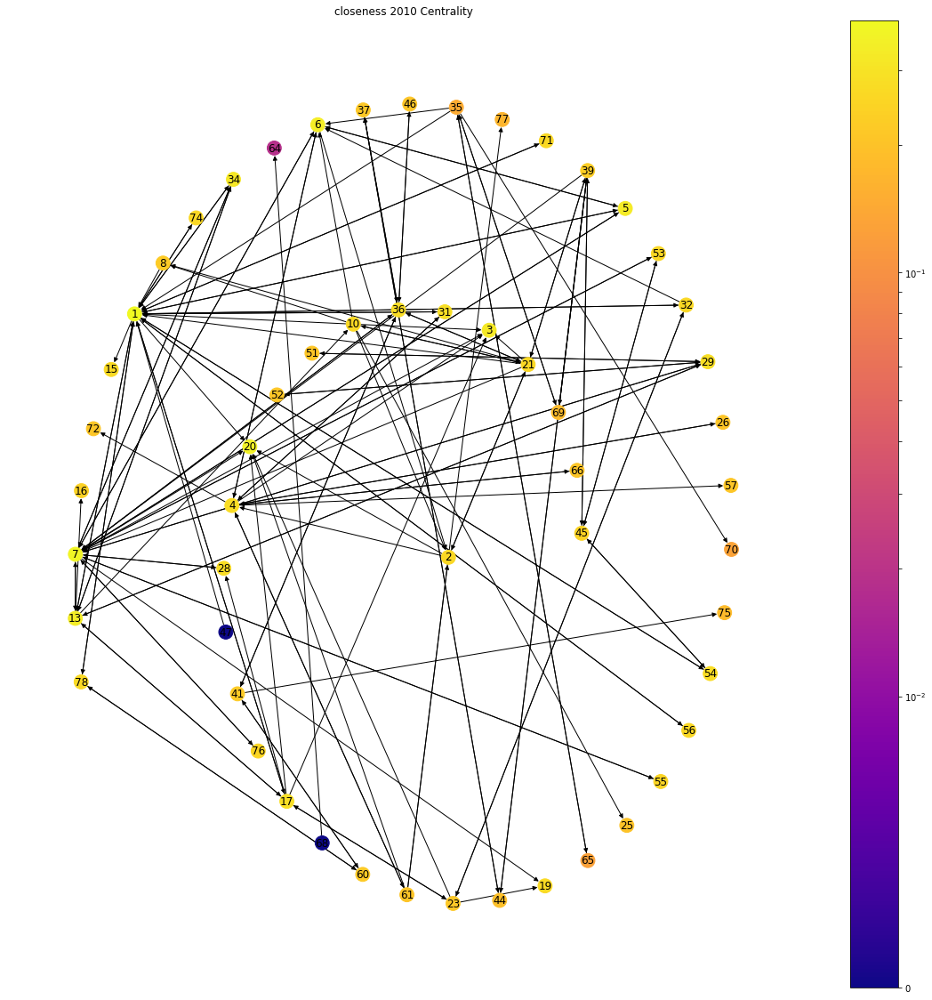

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2010, equidistant = True)
draw2(graph2010, pos, clos2010, 'closeness 2010 Centrality')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/closeness_centrality_GRAPH2010.png')

In [ ]:
degree2010 = nx.degree_centrality(graph2010)
degree10={}
values = []
for key,value in degree2010.items():
  if value >= 0:
    degree10[key]=value
  values.append(value)

print(len(degree10))
print(np.mean(values))
print(np.std(values))

55
0.09562289562289562
0.09905172260308091


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



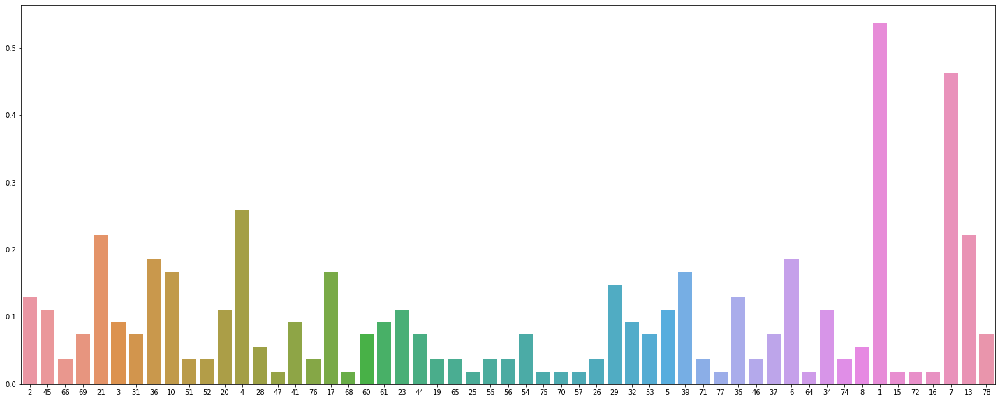

In [ ]:
plt.figure(figsize=(25,10))
sns.barplot(list(degree10.keys()), list(degree10.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/degree_centrality2010.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



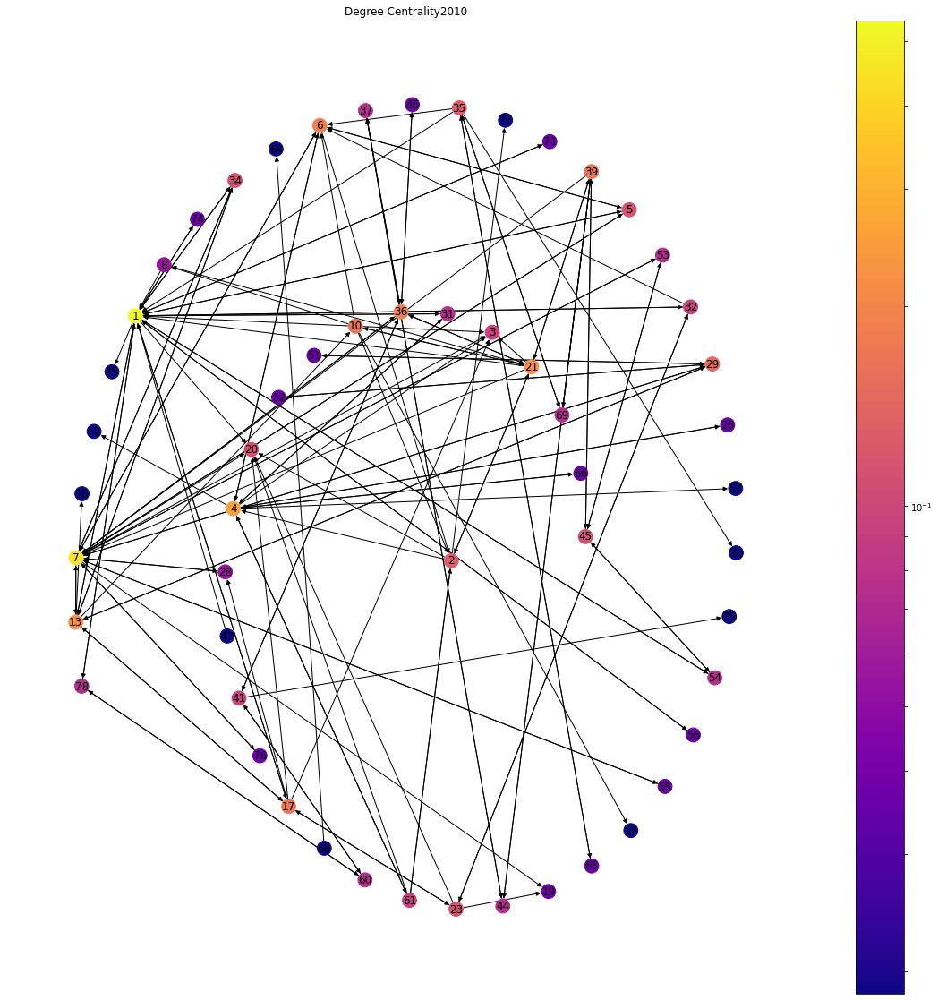

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2010, equidistant=True)
draw2(graph2010, pos, degree2010, 'Degree Centrality2010')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/degree_centrality_GRAPH2010.png')

In [ ]:
eige2010 = nx.eigenvector_centrality(graph2010)
eige10={}
values = []
for key,value in eige2010.items():
  if value >= 0:
    eige10[key]=value
  values.append(value)

print(len(eige10))
print(np.mean(values))
print(np.std(values))

55
0.09334954130319899
0.09730201087490704


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



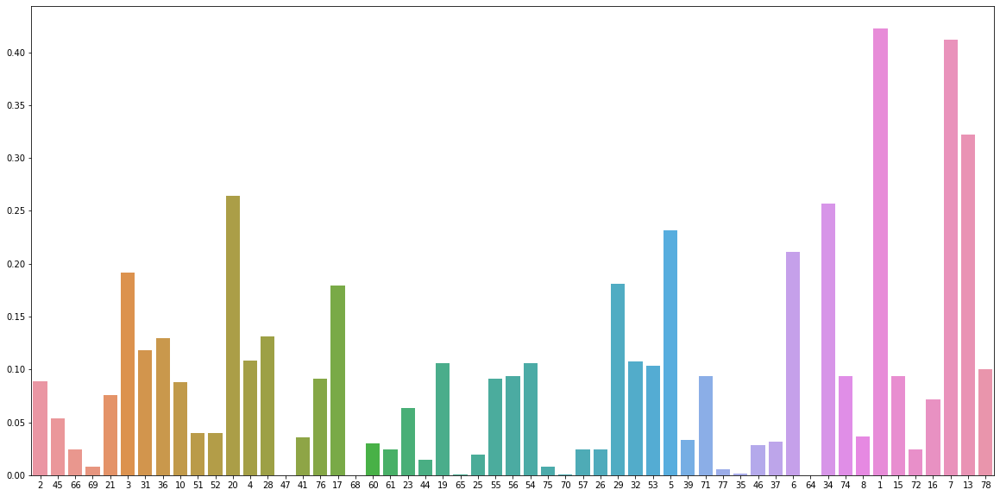

In [ ]:
plt.figure(figsize=(20,10))
sns.barplot(list(eige10.keys()), list(eige10.values()))
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/eigenvector_centrality2010.png')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning:

default base may change from np.e to 10.  To suppress this warning specify the base keyword argument.



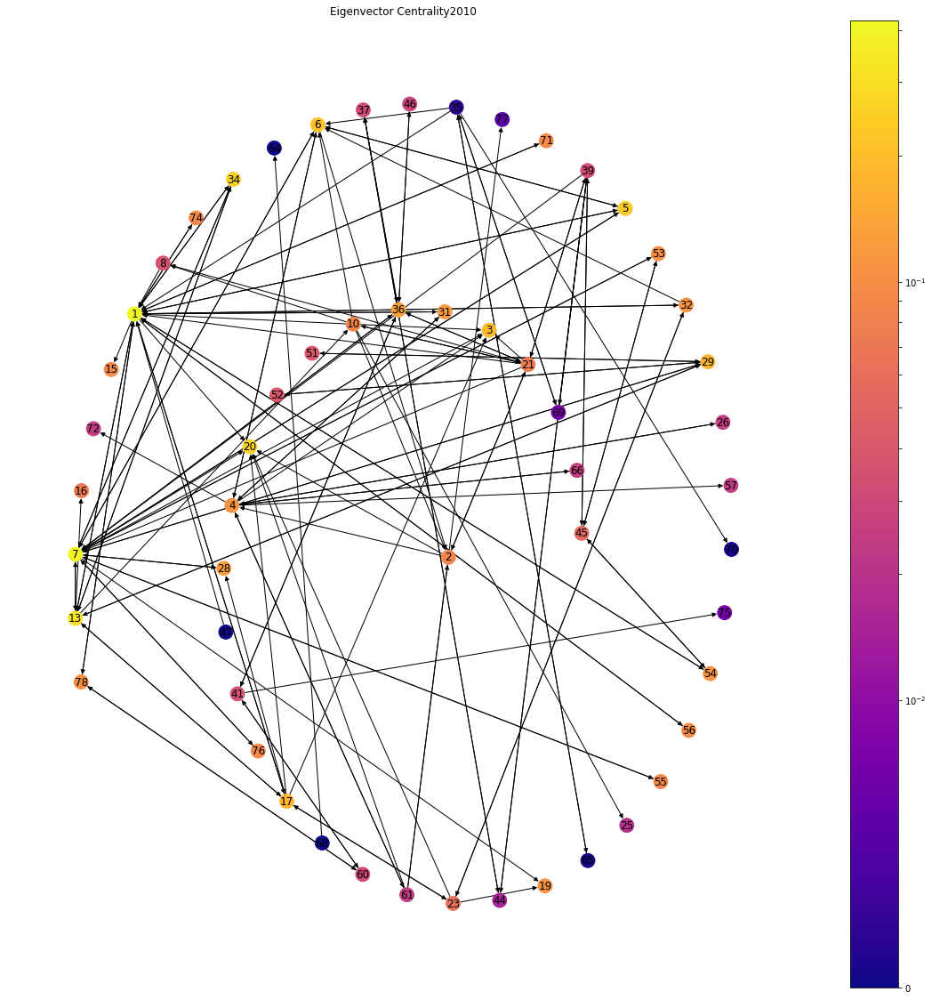

<Figure size 432x288 with 0 Axes>

In [ ]:
plt.figure(figsize=(20,20))
pos = nx.spiral_layout(graph2010, equidistant=True)
draw2(graph2010, pos, eige2010, 'Eigenvector Centrality2010')
plt.savefig('/content/drive/MyDrive/Progetto NetworkX/eigenvector_centrality_GRAPH2010.png')